# Accessing via Python

<DIV align="left" style="line-height:1.5em;">
<p>
The following is a collection of Python examples demonstrating how to connect to GIBS access points and exercise various capabilities. Included are examples of how to visualize raster and vector-based data from GIBS, plot imagery on maps, list GIBS capabilities, access GIBS metadata, basic image analysis and more. Please scroll down or use the navigation bar to browse through the examples.
</p>
These examples are also downloadable as a <a href="https://github.com/nasa-gibs/gibs-api-docs/raw/main/docs/python-usage.ipynb">Jupyter Notebook</a>.
</p>
</DIV>

__Import Python Packages And Modules__

<DIV align="left" style="line-height:1.5em;">
<p>
    
Major packages are requests, xml, json, skiimage, matplotlib, cartopy and pillow image.
    
</p>
</DIV>

In [1]:
# install necessary packages for imports 
%pip install scikit-image
%pip install scikit-learn
%pip install matplotlib
%pip install cartopy
%pip install folium
%pip install mapbox_vector_tile
%pip install lxml
%pip install pandas
%pip install owslib
%pip install geopandas
%pip install rasterio
%pip install fiona
%pip install ipyleaflet
%pip install cairosvg # If needed, more specific install instructions for cairosvg: https://cairosvg.org/documentation/ 

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.2/13.2 MB 29.8 MB/s  0:00:000.1 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 36.7 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5/5 [scikit-image]0m 4/5 [scikit-image]
Note: you may need to restart the kernel to use updated packages.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.6/8.6 MB 9.6 MB/s  0:00:00m 9.1 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3/3 [scikit-learn]━━━━━ 2/3 [scikit-learn]
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.0/11.0 MB 8.6 MB/s  0:00:018.4 MB/s eta 0:00:0101
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 17.6 MB/s  0:00:001.8 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 26.6 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4/4 [cartopy]━━━ 3/4 [cartopy]
Note: you may need to rest

In [2]:
import os
from io import BytesIO
from skimage import io
import requests
import json
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import cartopy.crs as ccrs
import cartopy
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import folium
import urllib.request
import urllib.parse
import mapbox_vector_tile
import xml.etree.ElementTree as xmlet
import lxml.etree as xmltree
from PIL import Image as plimg
from PIL import ImageDraw
import numpy as np
import pandas as pd
from owslib.wms import WebMapService
from IPython.display import Image, display
import geopandas as gpd
from shapely.geometry import box
import urllib.request
import rasterio
from rasterio.mask import mask
from rasterio.warp import calculate_default_transform, reproject, Resampling
from rasterio.plot import show
import fiona
from datetime import datetime, timedelta
%matplotlib inline

## OGC Web Map Service (WMS)

Web Map Service (WMS) is the preferred method for accessing static imagery (whereas Web Map Tile Service WMTS is preferred for interactive web maps). For smaller-scale, single image requests, WMS is usually easier to configure than WMTS and can also perform server-side compositing of multiple layers (both vector and raster).

<a id='basic_wms_connection'></a>

### Basic WMS Connection

First we will connect to the GIBS WMS Service and visualize the MODIS_Terra_CorrectedReflectance_TrueColor layer.

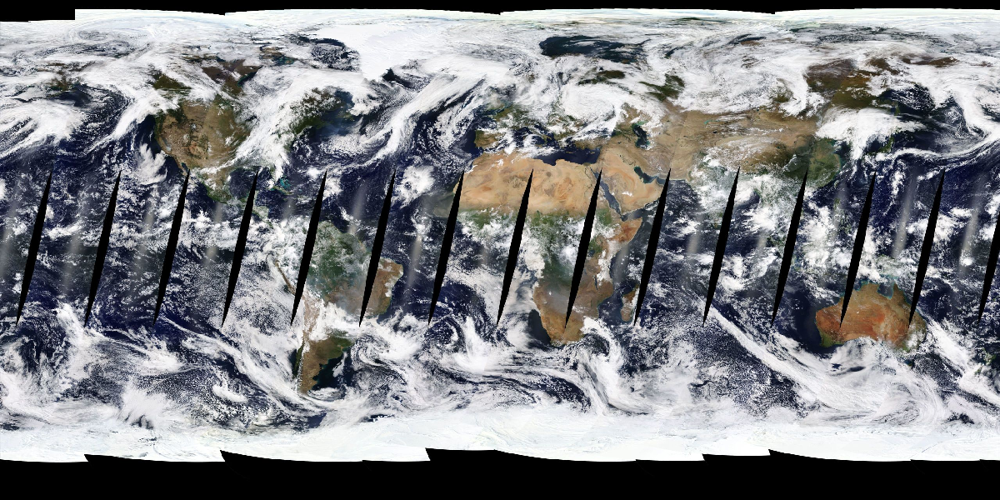

In [4]:
# Connect to GIBS WMS Service
wms = WebMapService('https://gibs.earthdata.nasa.gov/wms/epsg4326/best/wms.cgi?', version='1.1.1')

# Configure request for MODIS_Terra_CorrectedReflectance_TrueColor
img = wms.getmap(layers=['MODIS_Terra_CorrectedReflectance_TrueColor'],  # Layers
                 srs='epsg:4326',  # Map projection
                 bbox=(-180,-90,180,90),  # Bounds
                 size=(1200, 600),  # Image size
                 time='2021-09-21',  # Time of data
                 format='image/png',  # Image format
                 transparent=True)  # Nodata transparency

# Save output PNG to a file
out = open('MODIS_Terra_CorrectedReflectance_TrueColor.png', 'wb')
out.write(img.read())
out.close()

# View image
Image('MODIS_Terra_CorrectedReflectance_TrueColor.png')

### Get WMS Capabilities

<DIV align="left" style="line-height:1.5em;">
<p>
    
For WMS, first we want to access the "GetCapabilities" document . GIBS provides four map projections, so there are four WMS endpoints GetCapabilities:
    
Geographic - EPSG:4326: https://gibs.earthdata.nasa.gov/wms/epsg4326/best/wms.cgi 
    
Web Mercator - EPSG:3857: https://gibs.earthdata.nasa.gov/wms/epsg3857/best/wms.cgi
    
Arctic polar stereographic - EPSG:3413: https://gibs.earthdata.nasa.gov/wms/epsg3413/best/wms.cgi
    
Antarctic polar stereographic - EPSG:3031: https://gibs.earthdata.nasa.gov/wms/epsg3031/best/wms.cgi
     
The code below will show how to get capabilities.
</p>
</DIV>

In [5]:
# Construct capability URL.
wmsUrl = 'https://gibs.earthdata.nasa.gov/wms/epsg4326/best/wms.cgi?\
SERVICE=WMS&REQUEST=GetCapabilities'

# Request WMS capabilities.
response = requests.get(wmsUrl)

# Display capabilities XML in original format. Tag and content in one line.
WmsXml = xmltree.fromstring(response.content)
# print(xmltree.tostring(WmsXml, pretty_print = True, encoding = str))

<a id='display_wms_all_layers'></a>

### Display WMS All Layers

<DIV align="left" style="line-height:1.5em;">
<p>
    
Parse WMS capabilities XML to get total number of layers and display all layer names.
    
</p>
</DIV>

In [6]:
# Currently total layers are 1081.

# Coverts response to XML tree.
WmsTree = xmlet.fromstring(response.content)

alllayer = []
layerNumber = 0

# Parse XML.
for child in WmsTree.iter():
    for layer in child.findall("./{http://www.opengis.net/wms}Capability/{http://www.opengis.net/wms}Layer//*/"): 
         if layer.tag == '{http://www.opengis.net/wms}Layer': 
            f = layer.find("{http://www.opengis.net/wms}Name")
            if f is not None:
                alllayer.append(f.text)
                
                layerNumber += 1

print('There are layers: ' + str(layerNumber))

for one in sorted(alllayer)[:5]:
    print(one)
print('...')
for one in sorted(alllayer)[-5:]:
    print(one)

There are layers: 1362
AIRS_L2_Carbon_Monoxide_500hPa_Volume_Mixing_Ratio_Day
AIRS_L2_Carbon_Monoxide_500hPa_Volume_Mixing_Ratio_Night
AIRS_L2_Cloud_Top_Height_Day
AIRS_L2_Cloud_Top_Height_Night
AIRS_L2_Dust_Score_Day
...
VIIRS_SNPP_SurfaceReflectance_BandsM11-M7-M5
VIIRS_SNPP_SurfaceReflectance_BandsM5-M4-M3
VIIRS_SNPP_Thermal_Anomalies_375m_All
VIIRS_SNPP_Thermal_Anomalies_375m_Day
VIIRS_SNPP_Thermal_Anomalies_375m_Night


### Search WMS Layer And Its Attributes

<DIV align="left" style="line-height:1.5em;">
<p>
    
Requesting WMS data needs layer name, bounding box, time, projection, data format and so on. Enter a layer
name to search its attributes.
    
</p>
</DIV>

In [7]:
# Define layername to use.
layerName = 'Landsat_WELD_CorrectedReflectance_Bands157_Global_Annual'  

# Get general information of WMS.
for child in WmsTree.iter():
    if child.tag == '{http://www.opengis.net/wms}WMS_Capabilities': 
        print('Version: ' +child.get('version'))
    
    if child.tag == '{http://www.opengis.net/wms}Service': 
        print('Service: ' +child.find("{http://www.opengis.net/wms}Name").text)
        
    if child.tag == '{http://www.opengis.net/wms}Request': 
        print('Request: ')
        for e in child:
            print('\t ' + e.tag.partition('}')[2])
                            
        all = child.findall(".//{http://www.opengis.net/wms}Format")
        if all is not None:
            print("Format: ")
            for g in all:
                print("\t " + g.text)     
                
        for e in child.iter():
            if e.tag == "{http://www.opengis.net/wms}OnlineResource":
                print('URL: ' + e.get('{http://www.w3.org/1999/xlink}href'))
                break

# Get layer attributes.
for child in WmsTree.iter():
    for layer in child.findall("./{http://www.opengis.net/wms}Capability/{http://www.opengis.net/wms}Layer//*/"): 
         if layer.tag == '{http://www.opengis.net/wms}Layer': 
            f = layer.find("{http://www.opengis.net/wms}Name")
            if f is not None:
                if f.text == layerName:
                    # Layer name.
                    print('Layer: ' + f.text)
                    
                    # All elements and attributes:
                    # CRS
                    e = layer.find("{http://www.opengis.net/wms}CRS")
                    if e is not None:
                        print('\t CRS: ' + e.text)
                    
                    # BoundingBox.
                    e = layer.find("{http://www.opengis.net/wms}EX_GeographicBoundingBox")
                    if e is not None:
                        print('\t LonMin: ' + e.find("{http://www.opengis.net/wms}westBoundLongitude").text)
                        print('\t LonMax: ' + e.find("{http://www.opengis.net/wms}eastBoundLongitude").text)
                        print('\t LatMin: ' + e.find("{http://www.opengis.net/wms}southBoundLatitude").text)
                        print('\t LatMax: ' + e.find("{http://www.opengis.net/wms}northBoundLatitude").text)
                    
                    # Time extent.
                    e = layer.find("{http://www.opengis.net/wms}Dimension")
                    if e is not None:
                        print('\t TimeExtent: ' + e.text)
                        
                    # Style.
                    e = layer.find("{http://www.opengis.net/wms}Style")
                    if e is not None:
                        f = e.find("{http://www.opengis.net/wms}Name")
                        if f is not None:
                            print('\t Style: ' + f.text)

print('')                         

Version: 1.3.0
Service: WMS
Request: 
	 GetCapabilities
	 GetMap
Format: 
	 text/xml
	 image/png
	 image/jpeg
	 application/vnd.google-earth.kml.xml
	 application/vnd.google-earth.kmz
	 image/png; mode=8bit
	 image/vnd.jpeg-png
	 image/vnd.jpeg-png8
	 application/x-pdf
	 image/svg+xml
	 image/tiff
	 application/json
URL: https://gitc.earthdata.nasa.gov/wms/epsg4326/best/?
Layer: Landsat_WELD_CorrectedReflectance_Bands157_Global_Annual
	 CRS: EPSG:4326
	 LonMin: -180.000000
	 LonMax: 180.000000
	 LatMin: -90.000000
	 LatMax: 90.000000
	 TimeExtent: 1983-12-01/1985-12-01/P1Y,1988-12-01/1990-12-01/P1Y,1998-12-01/2000-12-01/P1Y



You can also use rasterio to access the properties of a geospatial raster file 


In [8]:
# Save a global extents tiff file
# Connect to GIBS WMS Service
wms = WebMapService('https://gibs.earthdata.nasa.gov/wms/epsg4326/best/wms.cgi?', version='1.3.0')

# Configure request for MODIS_Terra_SurfaceReflectance_Bands143
img = wms.getmap(layers=['MODIS_Terra_SurfaceReflectance_Bands143'],  # Layers
                 srs='epsg:4326',  # Map projection
                 bbox=(-180,-90,180,90),  # Bounds
                 size=(1024, 512),  # Image size
                 time='2021-11-25',  # Time of data
                 format='image/tiff',  # Image format
                 transparent=True)  # Nodata transparency

# Save output TIFF to a file
out = open('global.tiff', 'wb')
out.write(img.read())
out.close()

# Access properties of geospatial raster file 
with rasterio.open("global.tiff") as src:
    print(src.width, src.height)
    print(src.crs)
    print(src.transform)
    print(src.count)
    print(src.indexes)

1024 512
EPSG:4326
| 0.35, 0.00,-180.00|
| 0.00,-0.35, 90.00|
| 0.00, 0.00, 1.00|
4
(1, 2, 3, 4)


### Visualize WMS Raster Data In Geographic Projection

<DIV align="left" style="line-height:1.5em;">
<p>
    
This example shows how to get a geographic projection (EPSG:4326) image. Use a layer name and its attributes to form a URL for requesting a WMS image. After an image is returned, display it on a map using matplotlib and cartopy. 
    
</p>
</DIV>

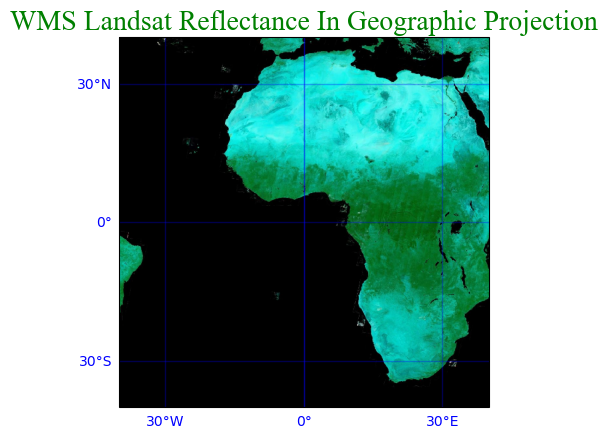

In [9]:
#  Construct Geographic projection URL.
proj4326 = 'https://gibs.earthdata.nasa.gov/wms/epsg4326/best/wms.cgi?\
version=1.3.0&service=WMS&\
request=GetMap&format=image/png&STYLE=default&bbox=-40,-40,40,40&CRS=EPSG:4326&\
HEIGHT=600&WIDTH=600&TIME=2000-12-01&layers=Landsat_WELD_CorrectedReflectance_Bands157_Global_Annual'

# Request image.
img = io.imread(proj4326)

# Display image on map.
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
extent = (-40, 40, -40, 40)
plt.imshow(img, transform = ccrs.PlateCarree(), extent = extent, origin = 'upper')

# Draw grid.
gl = ax.gridlines(ccrs.PlateCarree(), linewidth = 1, color = 'blue', alpha = 0.3,  draw_labels = True)
gl.top_labels = False
gl.right_labels = False
gl.xlines = True
gl.ylines = True
gl.xlocator = mticker.FixedLocator([0, 30, -30, 0])
gl.ylocator = mticker.FixedLocator([-30, 0, 30])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlabel_style = {'color': 'blue'}
gl.ylabel_style = {'color': 'blue'}

plt.title('WMS Landsat Reflectance In Geographic Projection',\
          fontname = "Times New Roman", fontsize = 20, color = 'green')

plt.show()

print('')

### Visualize WMS Raster Data In Web Mercator Projection

<DIV align="left" style="line-height:1.5em;">
<p>
    
This example shows how to get an image in WMS Web Mercator projection (EPSG:3857) and display it on map.
    
</p>
</DIV>

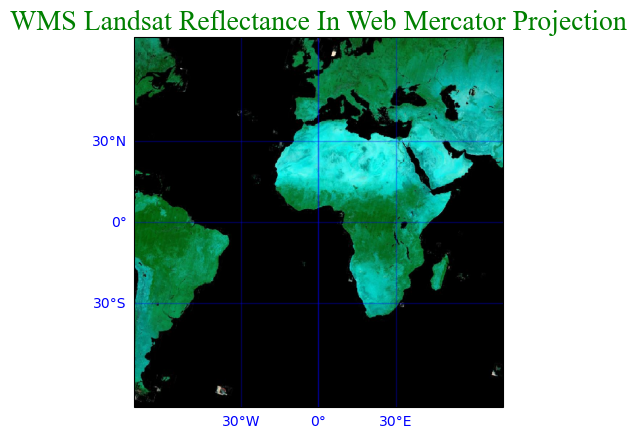

In [10]:
# Construct Web Mercator projection URL.
proj3857 = 'https://gibs.earthdata.nasa.gov/wms/epsg3857/best/wms.cgi?\
version=1.3.0&service=WMS&\
request=GetMap&format=image/png&STYLE=default&bbox=-8000000,-8000000,8000000,8000000&\
CRS=EPSG:3857&HEIGHT=600&WIDTH=600&TIME=2000-12-01&layers=Landsat_WELD_CorrectedReflectance_Bands157_Global_Annual'

# Request image.
img=io.imread(proj3857)

# Display image on map.
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1, projection = ccrs.Mercator.GOOGLE)
extent = (-8000000, 8000000, -8000000, 8000000)
plt.imshow(img, transform = ccrs.Mercator.GOOGLE, extent = extent, origin = 'upper')

# Draw grid.
gl = ax.gridlines(ccrs.PlateCarree(), linewidth = 1, color = 'blue', alpha = 0.3,  draw_labels = True)
gl.top_labels = False
gl.right_labels = False
gl.xlines = True
gl.ylines = True
gl.xlocator = mticker.FixedLocator([0, 30, -30, 0])
gl.ylocator = mticker.FixedLocator([-30, 0, 30])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlabel_style = {'color': 'blue'}
gl.ylabel_style = {'color': 'blue'}

plt.title('WMS Landsat Reflectance In Web Mercator Projection',
          fontname = "Times New Roman", fontsize = 20, color = 'green')

plt.show()

print('')

### Visualize WMS Raster Data In Arctic Polar Stereographic Projection

<DIV align="left" style="line-height:1.5em;">
<p>
    
This example shows how to get WMS Arctic Polar Stereographic projection (EPSG:3413) image and display it on map.
    
</p>
</DIV>

/Users/smore/miniconda3/envs/emat/lib/python3.12/site-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/50m_physical/ne_50m_coastline.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


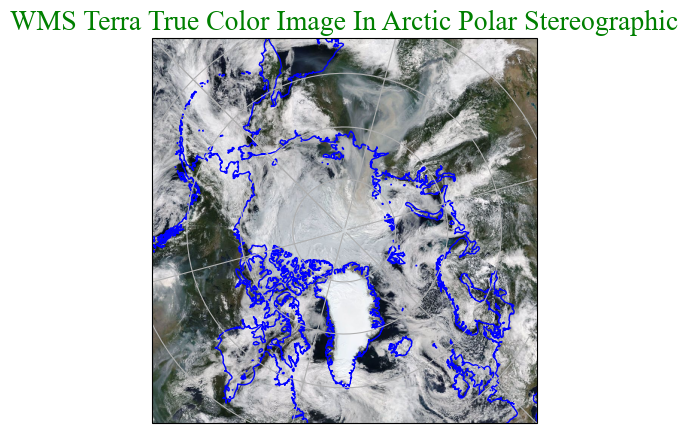

In [11]:
# Construct Arctic Polar Stereographic projection URL.
proj3413 = 'https://gibs.earthdata.nasa.gov/wms/epsg3413/best/wms.cgi?\
version=1.3.0&service=WMS&request=GetMap&\
format=image/png&STYLE=default&bbox=-4194300,-4194300,4194300,4194300&CRS=EPSG:3413&\
HEIGHT=512&WIDTH=512&TIME=2021-08-01&layers=MODIS_Terra_CorrectedReflectance_TrueColor'

# Request image.
img = io.imread(proj3413) 

# Display image on map.
plt.figure(figsize=(5, 5))
ax = plt.axes(projection=ccrs.NorthPolarStereo(central_longitude=-45))
plt.imshow(img, extent = (-4194300,4194300,-4194300,4194300), origin = 'upper')

# Draw coastline and grid.
ax.coastlines(color='blue', linewidth=1)
ax.gridlines()

plt.title('WMS Terra True Color Image In Arctic Polar Stereographic',\
          fontname = "Times New Roman", fontsize = 20, color = 'green')

plt.show()
 
print('')

### Visualize WMS Raster Data In Antarctic Polar Stereographic Projection

<DIV align="left" style="line-height:1.5em;">
<p>
    
This example shows how to get WMS Antarctic Polar Stereographic projection (EPSG:3031) image and display it on map.
    
</p>
</DIV>

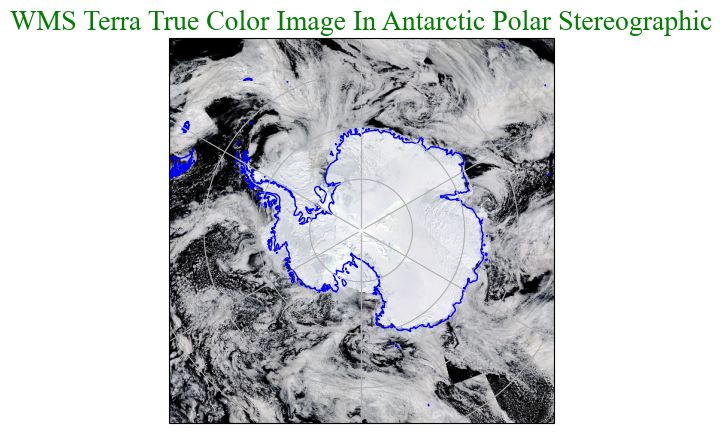

In [12]:
# Construct Antarctic Polar Stereographic project 
proj3031 = 'https://gibs.earthdata.nasa.gov/wms/epsg3031/best/wms.cgi?\
version=1.3.0&service=WMS&request=GetMap&\
format=image/png&STYLE=default&bbox=-4194300,-4194300,4194300,4194300&CRS=EPSG:3031&\
HEIGHT=512&WIDTH=512&TIME=2021-03-01&layers=MODIS_Terra_CorrectedReflectance_TrueColor'

# Request image.
img = io.imread(proj3031) 

# Display image on map.
plt.figure(figsize=(5, 5))
ax = plt.axes(projection=ccrs.SouthPolarStereo())
plt.imshow(img, extent = (-4194300,4194300,-4194300,4194300), origin = 'upper')

# Draw coastline and grid.
ax.coastlines(color='blue', linewidth=1)
ax.gridlines()

plt.title('WMS Terra True Color Image In Antarctic Polar Stereographic',\
          fontname = "Times New Roman", fontsize = 20, color = 'green')

plt.show()
 
print('')

### Visualize WMS Raster Data In Any Projection

<DIV align="left" style="line-height:1.5em;">
<p>
    
This example shows how to reproject WMS Raster Data to the projection of your choice using rasterio
    
</p>
</DIV>

In [13]:
# Here you can set the new projection to whatever you like 
dst_crs = 'EPSG:6933'

# Save a global extents tiff file
# Connect to GIBS WMS Service
wms = WebMapService('https://gibs.earthdata.nasa.gov/wms/epsg3857/best/wms.cgi?', version='1.3.0')

# Configure request for Landsat_WELD_CorrectedReflectance_Bands157_Global_Annual
img = wms.getmap(layers=['Landsat_WELD_CorrectedReflectance_Bands157_Global_Annual'],  # Layers
                 srs='epsg:3857',  # Map projection
                 bbox=(-8000000,-8000000,8000000,8000000),  # Bounds
                 size=(600, 600),  # Image size
                 time='2000-12-01',  # Time of data
                 format='image/tiff',  # Image format
                 transparent=True)  # Nodata transparency

# Save output TIFF to a file
out = open('global_extents_3857.tiff', 'wb')
out.write(img.read())
out.close()

with rasterio.open('global_extents_3857.tiff') as src:
    transform, width, height = calculate_default_transform(
        src.crs, dst_crs, src.width, src.height, *src.bounds)
    kwargs = src.meta.copy()
    kwargs.update({
        'crs': dst_crs,
        'transform': transform,
        'width': width,
        'height': height
    })

    with rasterio.open(os.getcwd()+'/reprojectedImage.byte.tif', 'w', **kwargs) as dst:
        for i in range(1, src.count + 1):
            reproject(
                source=rasterio.band(src, i),
                destination=rasterio.band(dst, i),
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform,
                dst_crs=dst_crs,
                resampling=Resampling.nearest)

reprojected_image = plimg.open('reprojectedImage.byte.tif', 'r')
plt.imshow(reprojected_image)

<a id="visualize_wms_global_raster_data"></a>

### Visualize WMS Global Raster Data

<DIV align="left" style="line-height:1.5em;">
<p>
    
This example shows how to get WMS global image and to display it on map.
    
</p>
</DIV>

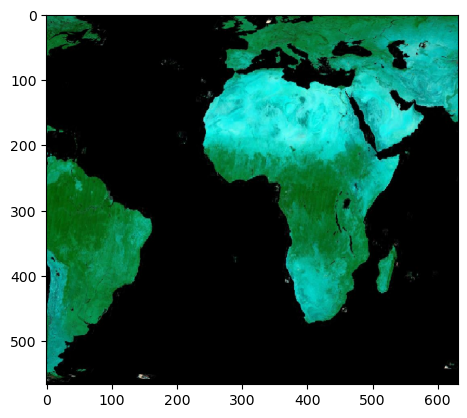

/Users/smore/miniconda3/envs/emat/lib/python3.12/site-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_coastline.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


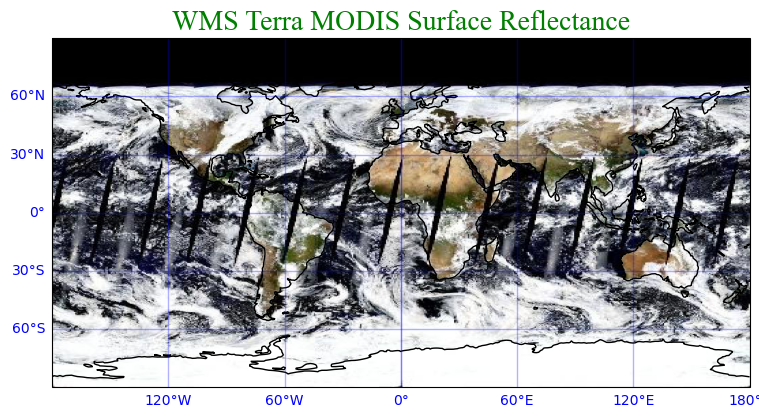

In [14]:
# Construct global image URL.
proj4326 = 'https://gibs.earthdata.nasa.gov/wms/epsg4326/best/wms.cgi?\
version=1.3.0&service=WMS&request=GetMap&\
format=image/jpeg&STYLE=default&bbox=-90,-180,90,180&CRS=EPSG:4326&\
HEIGHT=512&WIDTH=512&TIME=2021-11-25&layers=MODIS_Terra_SurfaceReflectance_Bands143'

# Request image.
img = io.imread(proj4326) 

# Display image on map.
plt.figure(figsize = (9, 6))
ax = plt.axes(projection = ccrs.PlateCarree(central_longitude = 0))
cmp = plt.imshow(img, transform = ccrs.PlateCarree(), extent = (-180,180,-90,90), origin = 'upper')

# Draw grid.
gl = ax.gridlines(ccrs.PlateCarree(), linewidth = 1, color = 'blue', alpha = 0.3,  draw_labels = True)
gl.top_labels = False
gl.right_labels = False
gl.xlines = True
gl.ylines = True
gl.xlocator = mticker.FixedLocator([0, 60, 120, 180, -120, -60, 0])
gl.ylocator = mticker.FixedLocator([-90, -60, -30, 0, 30, 60, 90])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlabel_style = {'color': 'blue'}
gl.ylabel_style = {'color': 'blue'}

# Draw coastline.
ax.coastlines()

plt.title('WMS Terra MODIS Surface Reflectance',fontname="Times New Roman", fontsize = 20, color = 'green')

plt.show()
 
print('')

### Visualize WMS Global Raster Data with Folium 

<DIV align="left" style="line-height:1.5em;">
<p>
    
This example shows how to display a WMS global image on an OpenStreetMap using Folium.
    
</p>
</DIV>

In [15]:
# Other tile options are "CartoDB Positron" and "CartoDB Voyager"
m = folium.Map(location=[41, -70], zoom_start=4, tiles="OpenStreetMap")

folium.WmsTileLayer(
    url="https://gibs.earthdata.nasa.gov/wms/epsg4326/best/wms.cgi",
    name="WMS Landsat Reflectance",
    fmt="image/png",
    layers="Landsat_WELD_CorrectedReflectance_Bands157_Global_Annual",
    transparent=True,
    overlay=True,
    control=True,
).add_to(m)

folium.LayerControl().add_to(m)

m

### Visualize WMS Global Vector Data

<DIV align="left" style="line-height:1.5em;">
<p>
    
This example shows how to get WMS global vector data and to display it on map.
    
</p>
</DIV>

In [16]:
# Construct WMS global vector URL.
wmsVector = 'https://gibs.earthdata.nasa.gov/wms/epsg4326/best/wms.cgi?\
TIME=2020-10-01T00:00:00Z&\
LAYERS=VIIRS_NOAA20_Thermal_Anomalies_375m_All&REQUEST=GetMap&SERVICE=WMS&\
FORMAT=image/png&WIDTH=480&HEIGHT=240&VERSION=1.1.1&SRS=epsg:4326&BBOX=-180,-90,180,90&TRANSPARENT=TRUE'

# Request image.
img = io.imread(wmsVector)

# Setup map size, projection and background.
fig = plt.figure(figsize = (10, 6))
ax = plt.axes(projection = ccrs.PlateCarree(central_longitude = 0))
ax.set_facecolor("white")
ax.stock_img()
ax.coastlines()

# Draw grid.
gl = ax.gridlines(ccrs.PlateCarree(), linewidth = 1, color = 'blue', alpha = 0.3,  draw_labels = True)
gl.top_labels = False
gl.right_labels = False
gl.xlines = True
gl.ylines = True
gl.xlocator = mticker.FixedLocator([0, 60, 120, -120, -60, 0])
gl.ylocator = mticker.FixedLocator([-90, -60, -30, 0, 30, 60, 90])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlabel_style = {'color': 'blue'}
gl.ylabel_style = {'color': 'blue'}

# Display image on map.
extent = (-180, 180, -90, 90)
plt.imshow(img, extent = extent)

plt.title('WMS Vector Data VIIRS Thermal Anomalies',\
          fontname = "Times New Roman", fontsize = 20, color = 'green')

print('')

### Interactive Web Map with WMS

<DIV align="left" style="line-height:1.5em;">
<p>

The next example shows how to display VIIRS_NOAA20_Thermal_Anomalies_375m_All layer in an interactive web map (may require additional Python libraries).

</p>
</DIV>

In [17]:
from ipyleaflet import Map, WMSLayer, basemaps

# Make a WMS connection to a map layer
wms_layer = WMSLayer(url='https://gibs.earthdata.nasa.gov/wms/epsg4326/best/wms.cgi?',
                     layers='VIIRS_NOAA20_Thermal_Anomalies_375m_All',
                     format='image/png',
                     transparent=True)

# Define map properties and add the WMS layer from above on top of basemap
m = Map(basemap=basemaps.NASAGIBS.BlueMarble, center=(0, -0), zoom=3)
m.add_layer(wms_layer)

# Display interactive web map
m

Map(center=[0, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text'…

Note that this will not render in our documents page, but will work if you try in your own notebook 

### Animated Web Map with WMS

<DIV align="left" style="line-height:1.5em;">
<p>

The next example shows how to display IMERG_Precipitation_Rate layer in an animated web map (may require additional Python libraries). 

</p>
</DIV>

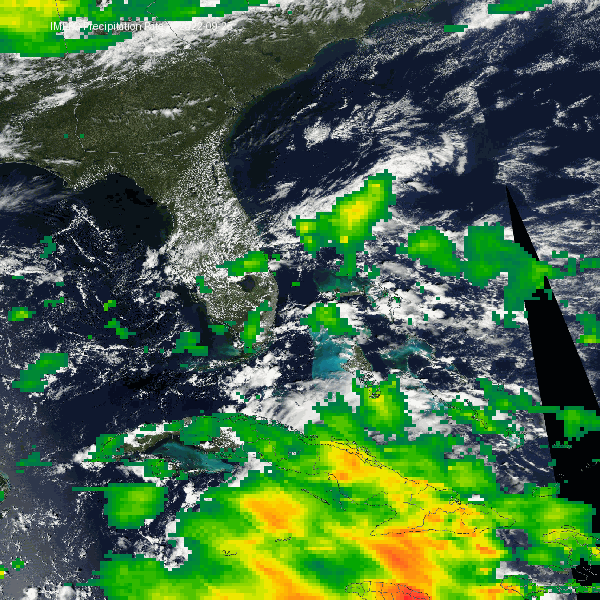

In [18]:
wms = WebMapService('https://gibs.earthdata.nasa.gov/wms/epsg4326/best/wms.cgi?', version='1.3.0')

layers = ['MODIS_Aqua_CorrectedReflectance_TrueColor',
          'IMERG_Precipitation_Rate',
          'Reference_Features',
          'Reference_Labels']
color = 'rgb(255,255,255)'
frames = []

start_date = datetime(2022, 9, 25)
end_date = datetime(2022, 10, 1)
dates = pd.date_range(start_date,end_date-timedelta(days=1),freq='d')

for day in dates:
    datatime = day.strftime("%Y-%m-%d")
    img = wms.getmap(layers=layers,  # Layers
                     srs='epsg:4326',  # Map projection
                     bbox=(-87, 18, -72, 35),  # Bounds
                     size=(600,600),  # Image size
                     time=datatime,  # Time of data
                     format='image/png',  # Image format
                     transparent=True)  # Nodata transparency

    image = plimg.open(img)
    draw = ImageDraw.Draw(image)
    (x, y) = (50, 20)
    draw.text((x, y), f'IMERG Precipitation Rate   -   {datatime}', fill=color)
    frames.append(image)
    
frames[0].save('IMERG_Precipitation_Rate_Ian.gif',
               format='GIF',
               append_images=frames,
               save_all=True,
               duration=1000,
               loop=0)

Image('IMERG_Precipitation_Rate_Ian.gif')

Note that this will not render in our documents page, but will work if you try in your own notebook 

### Display a Legend for a WMS Layer

<DIV align="left" style="line-height:1.5em;">
<p>

This example shows how the WMS GetCapabilities XML tree can be used to find and display a legend associated with a particular layer. For this example, we will use the "Croplands (Global Agricultural Lands, 2000)" layer.

We will use `WmsTree`, which was previously created in the <a href="#display_wms_all_layers">Display WMS All Layers</a> example from the XML tree returned by the WMS GetCapabilities request.

</p>
</DIV>

In [19]:
layerName = "Agricultural_Lands_Croplands_2000"
legendImg = None

for child in WmsTree.iter():
    for layer in child.findall("./{http://www.opengis.net/wms}Capability/{http://www.opengis.net/wms}Layer//*/"): 
         if layer.tag == '{http://www.opengis.net/wms}Layer': 
            f = layer.find("{http://www.opengis.net/wms}Name")
            if f is not None:
                if f.text == layerName:
                    # Style.
                    e = layer.find(("{http://www.opengis.net/wms}Style/" +
                                    "{http://www.opengis.net/wms}LegendURL/" +
                                    "{http://www.opengis.net/wms}OnlineResource"))
                    if e is not None:
                        legendURL = e.attrib["{http://www.w3.org/1999/xlink}href"]
                        legendImg = Image(url=legendURL)

print("Legend URL:", legendURL)
display(legendImg)

Legend URL: https://gibs.earthdata.nasa.gov/legends/Agricultural_Lands_Croplands_2000_H.png


### Visualize WMS Raster Data with a Legend

<DIV align="left" style="line-height:1.5em;">
<p>

This example visualizes a WMS raster layer with its associated legend. It follows the procedure for visualizing the WMS layer established in the <a href="#visualize_wms_global_raster_data">Visualize WMS Global Raster Data</a> example and makes use of the legend URL obtained in the previous example (`legendURL`).

</p>
</DIV>

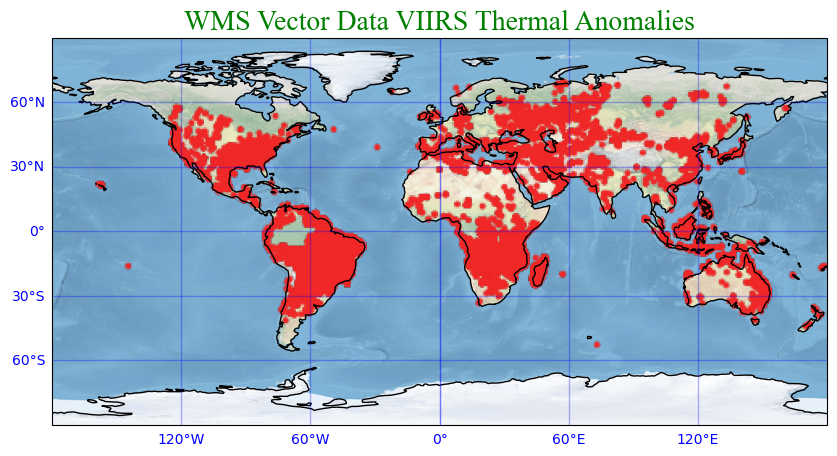

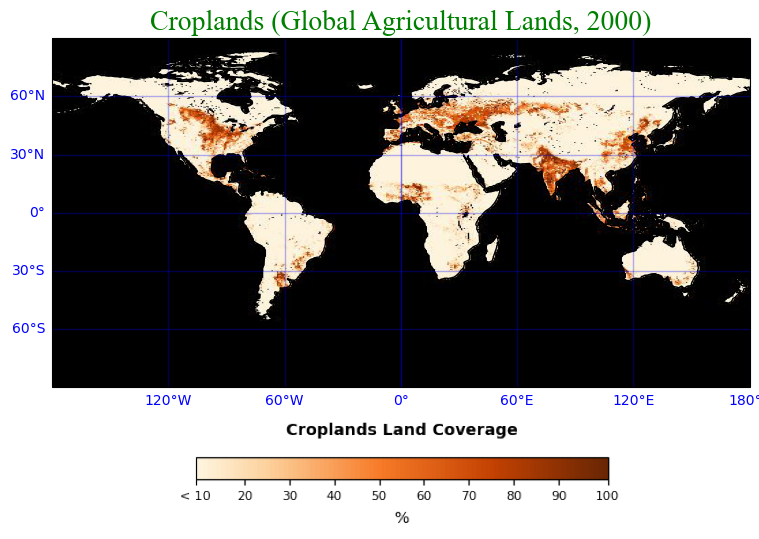

In [20]:
# Construct global image URL.
proj4326 = 'https://gibs.earthdata.nasa.gov/wms/epsg4326/best/wms.cgi?\
version=1.3.0&service=WMS&request=GetMap&\
format=image/jpeg&STYLE=default&bbox=-90,-180,90,180&CRS=EPSG:4326&\
HEIGHT=512&WIDTH=512&TIME=2021-11-25&layers=Agricultural_Lands_Croplands_2000'

# Request image.
img = io.imread(proj4326) 

# Display image on map.
plt.figure(figsize = (9, 6))
ax = plt.axes(projection = ccrs.PlateCarree(central_longitude = 0))
cmp = plt.imshow(img, transform = ccrs.PlateCarree(), extent = (-180,180,-90,90), origin = 'upper')

# Draw grid.
gl = ax.gridlines(ccrs.PlateCarree(), linewidth = 1, color = 'blue', alpha = 0.3,  draw_labels = True)
gl.top_labels = False
gl.right_labels = False
gl.xlines = True
gl.ylines = True
gl.xlocator = mticker.FixedLocator([0, 60, 120, 180, -120, -60, 0])
gl.ylocator = mticker.FixedLocator([-90, -60, -30, 0, 30, 60, 90])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlabel_style = {'color': 'blue'}
gl.ylabel_style = {'color': 'blue'}

# Draw coastline.
ax.coastlines()

plt.title('Croplands (Global Agricultural Lands, 2000)',fontname="Times New Roman", fontsize = 20, color = 'green')

# Get the legend image from the URL as a numpy array
legendImgArr = np.array(plimg.open(urllib.request.urlopen(legendURL)))


# use data coordinates to specify the position and dimensions of new inset axes
axin = ax.inset_axes([-125,-260,250,250],transform=ax.transData)
axin.imshow(legendImgArr)
axin.axis('off')

plt.show()
 
print('')

## OGC Web Map Tile Service (WMTS)

Web Map Tile Service (WMTS) is normally used for interactive web mapping, but may be used for general visualizations and data analysis. WMTS is much more responsive for interactive maps and very scalable for generating large images or bulk downloads, but compared to WMS, it is more challenging to configure if you just need a single, reasonably-sized image.

### Get WMTS Capabilities

<DIV align="left" style="line-height:1.5em;">
<p>
    
This example shows how to get WMTS capabilities and display the GetCapabilities XML content.
    
</p>
</DIV>

In [21]:
# Construct WMTS capability URL.
wmtsUrl = 'http://gibs.earthdata.nasa.gov/wmts/epsg4326/best/wmts.cgi?SERVICE=WMTS&REQUEST=GetCapabilities'

# Request capabilities.
response = requests.get(wmtsUrl)

# Display capability XML.
WmtsXml = xmltree.fromstring(response.content)

# Uncomment the following to display the large file:
# print(xmltree.tostring(WmtsXml, pretty_print = True, encoding = str))

<a id='display_wmts_all_layers'></a>

### Display All Layers of WMTS Capabilities.

<DIV align="left" style="line-height:1.5em;">
<p>
    
This example shows how to parse the WMTS GetCapabilities document and print the names of all of its layers.
    
</p>
</DIV>

In [22]:
# Convert capability response to XML tree.
WmtsTree = xmlet.fromstring(response.content)

alllayer = []
layerNumber = 0

# Parse capability XML tree.
for child in WmtsTree.iter():
    for layer in child.findall("./{http://www.opengis.net/wmts/1.0}Layer"): 
         if '{http://www.opengis.net/wmts/1.0}Layer' == layer.tag: 
            f=layer.find("{http://www.opengis.net/ows/1.1}Identifier")
            if f is not None:
                alllayer.append(f.text)
                layerNumber += 1

# Print the first five and last five layers.
print('Number of layers: ', layerNumber)
for one in sorted(alllayer)[:5]:
    print(one)
print('...')
for one in sorted(alllayer)[-5:]:
    print(one)       

Number of layers:  1219
AIRS_L2_Carbon_Monoxide_500hPa_Volume_Mixing_Ratio_Day
AIRS_L2_Carbon_Monoxide_500hPa_Volume_Mixing_Ratio_Night
AIRS_L2_Cloud_Top_Height_Day
AIRS_L2_Cloud_Top_Height_Night
AIRS_L2_Dust_Score_Day
...
VIIRS_SNPP_SurfaceReflectance_BandsM11-M7-M5
VIIRS_SNPP_SurfaceReflectance_BandsM5-M4-M3
VIIRS_SNPP_Thermal_Anomalies_375m_All
VIIRS_SNPP_Thermal_Anomalies_375m_Day
VIIRS_SNPP_Thermal_Anomalies_375m_Night


### Search WMTS Vector Layer, Attributes And Vector Information

<DIV align="left" style="line-height:1.5em;">
<p>
    
This example shows how to search a WMTS layer and to parse its attributes and vector information.
    
</p>
</DIV>

In [23]:
# Get general information of WMTS from XML tree.
for child in WmtsTree.iter():
    if child.tag == '{http://www.opengis.net/wmts/1.0}Capabilities': 
        print('Version: ' + child.get('version'))
    
    if child.tag == '{http://www.opengis.net/ows/1.1}ServiceType': 
        print('Service: ' + child.text)
        
    if child.tag == '{http://www.opengis.net/ows/1.1}OperationsMetadata': 
        print('Request: ')
        for e in child:
            print('\t ' + e.get('name'))

# Parse layer attributes and vector information.
for child in WmtsTree.iter():
    for layer in child.findall("./{http://www.opengis.net/wmts/1.0}Layer"): 
         if '{http://www.opengis.net/wmts/1.0}Layer' == layer.tag: 
            f = layer.find("{http://www.opengis.net/ows/1.1}Identifier")
            if f is not None:
                if f.text == 'MODIS_Aqua_Thermal_Anomalies_All':
                    # Layer name.
                    print('Layer: ' + f.text)
                    
                    # All elements and attributes:
                    
                    # BoundingBox.
                    e = layer.find("{http://www.opengis.net/ows/1.1}WGS84BoundingBox")
                    if e is not None:
                        print("\t crs: " + e.get('crs'))
                        print("\t UpperCorner: " + e.find("{http://www.opengis.net/ows/1.1}UpperCorner").text)
                        print("\t LowerCorner: " + e.find("{http://www.opengis.net/ows/1.1}LowerCorner").text)
                    
                    # TileMatrixSet.
                    e = layer.find("{http://www.opengis.net/wmts/1.0}TileMatrixSetLink")
                    if e is not None:
                        print("\t TileMatrixSet: " + e.find("{http://www.opengis.net/wmts/1.0}TileMatrixSet").text)
                        
                    # Time extent.
                    e = layer.find("{http://www.opengis.net/wmts/1.0}Dimension")
                    if e is not None:
                        all = e.findall("{http://www.opengis.net/wmts/1.0}Value")
                        if all is not None:
                            print("\t TimeExtent: ")
                            for g in all:
                                print("\t\t " + g.text)
                        
                    # Format.
                    e = layer.find("{http://www.opengis.net/wmts/1.0}Format")
                    if e is not None:
                        print("\t Format: " + e.text)
                    
                    # Style.
                    e = layer.find("{http://www.opengis.net/wmts/1.0}Style")
                    if e is not None:
                        g=e.find("{http://www.opengis.net/ows/1.1}Identifier")
                        if g is not None:
                            print("\t Style: " + g.text)
                       
                    # Template.
                    e = layer.find("{http://www.opengis.net/wmts/1.0}ResourceURL")
                    if e is not None:
                        print("\t Template: " + e.get('template'))
                        
                    # Vector metadata.                    
                    for e in layer.findall("{http://www.opengis.net/ows/1.1}Metadata"):
                        if "vector-metadata" in e.get("{http://www.w3.org/1999/xlink}href"):
                            vectorMetadata=e.get("{http://www.w3.org/1999/xlink}href")
                            print('\t Vector metadata: ' + vectorMetadata)
                                  
                            response = urllib.request.urlopen(vectorMetadata)

                            # Load to json.
                            data = json.loads(response.read())

                            # Parse json.
                            for p in data['mvt_properties']:
                                keys = list(p.keys())
                                if 'Identifier' in keys:
                                    print('\t\t Identifier: ' + p['Identifier'])
                                if 'Title' in keys:
                                    print('\t\t Title: ' + p['Title'])
                                if 'Description' in keys:
                                    print('\t\t Description: ' + p['Description'])
                                if 'Units' in keys:
                                    print('\t\t Units: ' + p['Units'])
                                if 'DataType' in keys:
                                    print('\t\t DataType: ' + p['DataType'])
                                if 'ValueRanges' in keys:
                                    print('\t\t ValueRanges: ' + str(p['ValueRanges']))
                                if 'ValueMap' in keys:
                                    print('\t\t ValueMap: ' + str(p['ValueMap']))   
                                if 'Function' in keys:
                                    print('\t\t Function: ' + p['Function'])
                                if 'IsOptional' in keys:
                                    print('\t\t IsOptional: ' + str(p['IsOptional']))
                                if 'IsLabel' in keys:
                                    print('\t\t IsLabel: ' + str(p['IsLabel']))
                                
                                print('\n')
                            
                            # There two vector metadata. Only need one, so break.
                            break      
                    
print('')

Version: 1.0.0
Service: OGC WMTS
Request: 
	 GetCapabilities
	 GetTile
Layer: MODIS_Aqua_Thermal_Anomalies_All
	 crs: urn:ogc:def:crs:OGC:2:84
	 UpperCorner: 180 90
	 LowerCorner: -180 -90
	 TileMatrixSet: 1km
	 TimeExtent: 
		 2002-07-04/2002-07-29/P1D
		 2002-08-08/2002-09-12/P1D
		 2002-09-14/2020-08-16/P1D
		 2020-09-02/2023-02-24/P1D
		 2023-02-28/2023-07-08/P1D
		 2023-07-10/2025-09-25/P1D
	 Format: application/vnd.mapbox-vector-tile
	 Style: default
	 Template: https://gibs.earthdata.nasa.gov/wmts/epsg4326/best/MODIS_Aqua_Thermal_Anomalies_All/default/{Time}/{TileMatrixSet}/{TileMatrix}/{TileRow}/{TileCol}.mvt
	 Vector metadata: https://gibs.earthdata.nasa.gov/vector-metadata/v1.0/FIRMS_MODIS_Thermal_Anomalies.json
		 Identifier: LATITUDE
		 Title: Latitude
		 Description: Latitude in Decimal Degrees
		 Units: °
		 DataType: float
		 Function: Describe
		 IsOptional: False
		 IsLabel: False


		 Identifier: LONGITUDE
		 Title: Longitude
		 Description: Longitude in Decimal Degre

### Read WMTS Vector Data

<DIV align="left" style="line-height:1.5em;">
<p>
    
This example shows how to get WMTS vector data from a Mapbox Vector Tile (MVT). Also shows how to parse vector data values.
    
</p>
</DIV>

In [24]:
# Vector data format.
'''
{
   'MODIS_Aqua_Thermal_Anomalies_All':
   {
    'extent': 4096,
    'version': 1, 
    'features': 
    [
        {'geometry': 
            {'type': 'Point', 
             'coordinates': [4028, 3959]}, 
             'properties': {'LATITUDE': 35.397, 
                            'LONGITUDE': -90.3, 
                            'BRIGHTNESS': 307.3, 
                            'SCAN': 3.2, 
                            'TRACK': 1.7, 
                            'ACQ_DATE': '2020-10-01', 
                            'ACQ_TIME': '18:30', 
                            'SATELLITE': 'A', 
                            'CONFIDENCE': 48, 
                            'VERSION': '6.0NRT', 
                            'BRIGHT_T31': 296.0, 
                            'FRP': 21.4, 
                            'DAYNIGHT': 'D', 
                            'UID': 13159}, 
                            'id': 0,
                            'type': 1
                           }
            }
        }
        ,,,
    ]
}
'''

# Below both kvp and restful methods work. 
'''
kvp = 'https://gibs.earthdata.nasa.gov/wmts/epsg4326/best/wmts.cgi?\
TIME=2020-10-01T00:00:00Z&FORMAT=application/vnd.mapbox-vector-tile&\
layer=MODIS_Aqua_Thermal_Anomalies_All&tilematrixset=1km&\
Service=WMTS&Request=GetTile&Version=1.0.0&TileMatrix=4&TileCol=3&TileRow=3'
response = requests.get(kvp)
'''

restful = 'https://gibs.earthdata.nasa.gov/wmts/epsg4326/best/MODIS_Aqua_Thermal_Anomalies_All\
/default/2020-10-01T00:00:00Z/1km/4/3/4.mvt'

# Request data.
response = requests.get(restful)

# Parse vector values.
data = response.content
dataDictionary = mapbox_vector_tile.decode(data)
for key in dataDictionary.keys():
    parameterDictionary = dataDictionary[key]
    features = parameterDictionary['features']
    # Print vector data format.
    #print(features)

    lat = []
    lon = []
    brightness = []
    for f in features:
        p = f['properties']
        lat.append(p['LATITUDE'])
        lon.append(p['LONGITUDE'])
        brightness.append(p['BRIGHTNESS'])
        
print('lat number: ' + str(len(lat)))
print(str(lat))
print('lon number: ' + str(len(lon)))
print(str(lon))
print('brightness number: ' + str(len(brightness)))
print('brightness min: ' + str(min(brightness)))
print('brightness min: ' + str(max(brightness)))
print(str(brightness))

print('')

lat number: 81
[35.397, 35.403, 35.405, 35.446, 35.45, 35.454, 35.467, 35.47, 35.484, 36.053, 33.225, 33.449, 33.45, 33.451, 33.451, 33.625, 33.627, 33.755, 33.756, 33.77, 33.8, 33.803, 33.853, 33.853, 33.855, 33.867, 34.076, 34.346, 34.356, 34.457, 31.032, 31.034, 31.046, 31.048, 31.365, 31.608, 31.89, 31.892, 31.899, 18.316, 19.026, 19.091, 19.094, 19.232, 19.592, 19.594, 19.639, 19.653, 19.8, 19.808, 19.961, 20.518, 20.601, 20.611, 20.723, 20.725, 21.151, 21.726, 21.728, 21.911, 22.04, 22.917, 23.775, 25.189, 25.191, 25.228, 25.723, 25.843, 27.436, 27.447, 28.799, 28.801, 28.914, 29.095, 29.096, 29.527, 29.529, 29.529, 29.531, 29.561, 29.805]
lon number: 81
[-90.3, -90.272, -90.266, -90.676, -90.67, -90.641, -92.205, -92.215, -92.209, -89.904, -91.815, -94.62, -94.167, -94.593, -94.589, -93.99, -93.982, -94.507, -94.516, -94.509, -93.806, -93.798, -94.621, -94.626, -94.594, -94.627, -96.957, -91.197, -91.157, -91.021, -95.208, -95.182, -95.209, -95.183, -98.348, -95.122, -90.842, -9

### Display WMTS Vector Data

<DIV align="left" style="line-height:1.5em;">
<p>
    
This example shows how to overlay WMTS vector data values from last cell on a map with a legend.
    
</p>
</DIV>

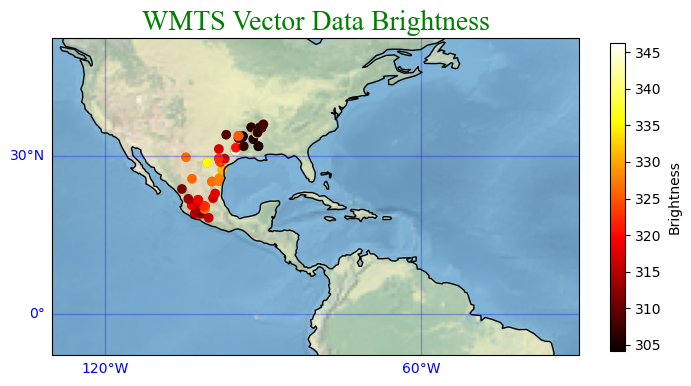

In [25]:
# Setup map size and projection.
fig = plt.figure(figsize = (8, 5))

ax = plt.axes(projection = ccrs.PlateCarree(central_longitude = 0))

# x min, x max, y min, y max.
extent = (-130,-30,-5,40)
ax.set_extent(extent)

# Plot lat, lon and brightness.
cmp = ax.scatter(lon, lat, c = brightness, cmap = 'hot')

# Plot legend.
cb = plt.colorbar(cmp, orientation='vertical',
                  fraction = 0.1, pad = 0.05, shrink = 0.8, label = 'Brightness'
                  ).outline.set_visible(True)

# Draw background.
ax.stock_img()
ax.coastlines()

# Draw grid.
gl = ax.gridlines(ccrs.PlateCarree(), linewidth=1, color = 'blue', alpha = 0.3,  draw_labels = True)
gl.top_labels = False
gl.right_labels = False
gl.xlines = True
gl.ylines = True
gl.xlocator = mticker.FixedLocator([0, 60, 120, -120, -60, 0])
gl.ylocator = mticker.FixedLocator([-60, -30, 0, 30, 60])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlabel_style = {'color': 'blue'}
gl.ylabel_style = {'color': 'blue'}

plt.title('WMTS Vector Data Brightness',\
          fontname = "Times New Roman", fontsize = 20, color = 'green')

plt.show()

print('')

### Visualize WMTS Raster Data By Cartopy

<DIV align="left" style="line-height:1.5em;">
<p>
    
This example shows how to display WMTS raster data on a map using Cartopy.
    
</p>
</DIV>

/Users/smore/miniconda3/envs/emat/lib/python3.12/site-packages/owslib/wmts.py:862: FutureWarning: Truth-testing of elements was a source of confusion and will always return True in future versions. Use specific 'len(elem)' or 'elem is not None' test instead.
  if current and current.text == 'true':
/Users/smore/miniconda3/envs/emat/lib/python3.12/site-packages/owslib/wmts.py:659: RuntimeWarning: TileMatrixLimits with tileMatrix "1" already exists
  warnings.warn(msg, RuntimeWarning)
/Users/smore/miniconda3/envs/emat/lib/python3.12/site-packages/owslib/wmts.py:659: RuntimeWarning: TileMatrixLimits with tileMatrix "2" already exists
  warnings.warn(msg, RuntimeWarning)
/Users/smore/miniconda3/envs/emat/lib/python3.12/site-packages/owslib/wmts.py:659: RuntimeWarning: TileMatrixLimits with tileMatrix "3" already exists
  warnings.warn(msg, RuntimeWarning)
/Users/smore/miniconda3/envs/emat/lib/python3.12/site-packages/owslib/wmts.py:659: RuntimeWarning: TileMatrixLimits with tileMatrix "4" 

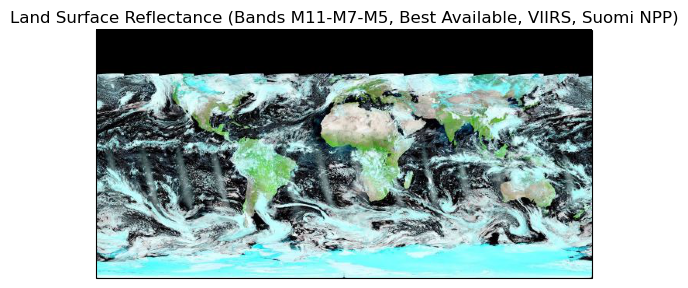

In [26]:
# Define the WMTS URL
wmts_url = "https://gibs.earthdata.nasa.gov/wmts/epsg4326/best/wmts.cgi"

# Create a map with PlateCarree projection
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([-180, 180, -90, 90])  # World extent

# Add WMTS layer with a specific date
layer = "VIIRS_SNPP_SurfaceReflectance_BandsM11-M7-M5"
time = "2023-01-01"
ax.add_wmts(wmts_url, layer_name=layer, wmts_kwargs={"time": time})

plt.title('Land Surface Reflectance (Bands M11-M7-M5, Best Available, VIIRS, Suomi NPP)')
plt.show()

<a id="visualize_wmts_raster_data"></a>

### Visualize WMTS Raster Data By GDAL

<DIV align="left" style="line-height:1.5em;">
<p>
    
This example shows how to get WMTS raster data using GDAL and to display it on a map.

The Geospatial Data Abstraction Library (GDAL) has minidrivers to access WMTS. Please refer to the minidrivers
for details: <a href=https://gdal.org/drivers/raster/wmts.html>GDAL minidrivers</a>
 
First, make an XML file like in the next cell and save it as globe.xml file.
Then at the command line, run: `gdal_translate -of JPEG -outsize 1200 600 -projwin -180 90 180 -90 python-examples/globe.xml python-examples/globe.jpg`
    
</p>
</DIV>

In [27]:
# Make GDAL input XML file like globe.xml below.
xml = xmltree.parse("python-examples/globe.xml")
pretty = xmltree.tostring(xml, encoding="unicode", pretty_print=True)
print(pretty)

OSError: Error reading file 'python-examples/globe.xml': failed to load "python-examples/globe.xml": No such file or directory

In [ ]:
# Run GDAL command.
cmd  = 'gdal_translate -of JPEG -outsize 1200 600 -projwin -180 90 180 -90 python-examples/globe.xml python-examples/globe.jpg'
os.system(cmd)

# Output image is globe.jpg.
img = plimg.open('python-examples/globe.jpg')

# Setup map size and projection.
fig = plt.figure(figsize = (5, 10), dpi = 100)
ax = plt.axes([1, 1, 1, 1], projection = ccrs.PlateCarree(central_longitude = 0))
ax.set_xlim([-180, 180])
ax.set_ylim([-90, 90])

# Display image on map.
imgExtent = (-180,180,-90,90)
cmp = plt.imshow(img, extent = imgExtent)

# Draw coastline.
ax.coastlines()

# Draw grid.
gl = ax.gridlines(ccrs.PlateCarree(), linewidth = 1, color = 'blue', alpha = 0.3,  draw_labels = True)
gl.top_labels = False
gl.right_labels = False
gl.xlines = True
gl.ylines = True
#gl.xlocator = mticker.FixedLocator([0, 60, 120, -120, -60])
gl.ylocator = mticker.FixedLocator([-90, -60, -30, 0, 30, 60, 90])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlabel_style = {'color': 'blue'}
gl.ylabel_style = {'color': 'blue'}

plt.title('WMTS Terra True Color Image By GDAL',\
          fontname = "Times New Roman", fontsize = 20, color = 'green')

plt.show()

print('')

<a id="display_legends_wmts"></a>

### Display Legends for a WMTS Layer

<DIV align="left" style="line-height:1.5em;">
<p>

This example shows how the WMTS GetCapabilities XML tree can be used to find and display a legend associated with a particular layer. For this example, we will use the "Croplands (Global Agricultural Lands, 2000)" layer.

We will use `WmtsTree`, which was previously created in the <a href="#display_wmts_all_layers">Display WMTS All Layers of capabilities</a> example from the XML tree returned by the WMTS GetCapabilities request. Both the vertical and horizontal legends will be displayed here.

</p>
</DIV>

In [22]:
layerName = "Agricultural_Lands_Croplands_2000"
legendURLHorizontal = None
legendURLVertical = None

# Parse layer attributes and vector information.
for child in WmtsTree.iter():
    for layer in child.findall("./{http://www.opengis.net/wmts/1.0}Layer"): 
         if '{http://www.opengis.net/wmts/1.0}Layer' == layer.tag: 
            f = layer.find("{http://www.opengis.net/ows/1.1}Identifier")
            if f is not None:
                if f.text == layerName:                    
                    # Style tag
                    e = layer.find("{http://www.opengis.net/wmts/1.0}Style")
                    if e is not None:
                        for legendTag in e.findall("{http://www.opengis.net/wmts/1.0}LegendURL"):
                            # Horizontal legend
                            if legendTag.attrib["{http://www.w3.org/1999/xlink}role"] == "http://earthdata.nasa.gov/gibs/legend-type/horizontal":
                                legendURLHorizontal = legendTag.attrib["{http://www.w3.org/1999/xlink}href"]
                            # Vertical legend
                            else:
                                legendURLVertical = legendTag.attrib["{http://www.w3.org/1999/xlink}href"]

print("Horizontal Legend:\n")
display(Image(url=legendURLHorizontal))
print("Vertical Legend:\n")
display(Image(url=legendURLVertical))

Horizontal Legend:



Vertical Legend:



<a id="visualize_wmts_raster_data_legend"></a>

### Visualize WMTS Raster Data with a Legend

<DIV align="left" style="line-height:1.5em;">
<p>

This example visualizes a WMTS raster layer with its associated legend. It follows the procedure for visualizing the WMTS layer established in the <a href="#visualize_wmts_raster_data">Visualize WMS Global Raster Data</a> example and makes use of the legend URLs obtained in the previous example (`legendURLHorizontal` and `legendURLVertical`).

For this example, we will use the <a href="https://github.com/Kozea/CairoSVG">cairosvg</a> package to convert the SVG legends used by WMTS to PNG format so that they may be visualized with matplotlib. Both the horizontal and vertical legend options will be displayed.

</p>
</DIV>

In [23]:
# Make GDAL input XML file like globe_cropland.xml below.
xml = xmltree.parse("python-examples/globe_cropland.xml")
pretty = xmltree.tostring(xml, encoding="unicode", pretty_print=True)
print(pretty)

<GDAL_WMS>
    <Service name="TMS">
        <ServerUrl>https://gibs.earthdata.nasa.gov/wmts/epsg4326/best/Agricultural_Lands_Croplands_2000/default/1km/${z}/${y}/${x}.png</ServerUrl>
    </Service>
    <Transparent>TRUE</Transparent>
    <DataWindow>
        <UpperLeftX>-180.0</UpperLeftX>
        <UpperLeftY>90</UpperLeftY>
        <LowerRightX>396.0</LowerRightX>
        <LowerRightY>-198</LowerRightY>
        <TileLevel>8</TileLevel>
        <TileCountX>2</TileCountX>
        <TileCountY>1</TileCountY>
        <YOrigin>top</YOrigin>
    </DataWindow>
    <BlockSizeX>512</BlockSizeX>
    <BlockSizeY>512</BlockSizeY>
    <Projection>EPSG:4326</Projection>
    <BandsCount>3</BandsCount>
</GDAL_WMS>



Input file size is 262144, 131072
0...10...20...30...40...50...60...70...80...90...100 - done.


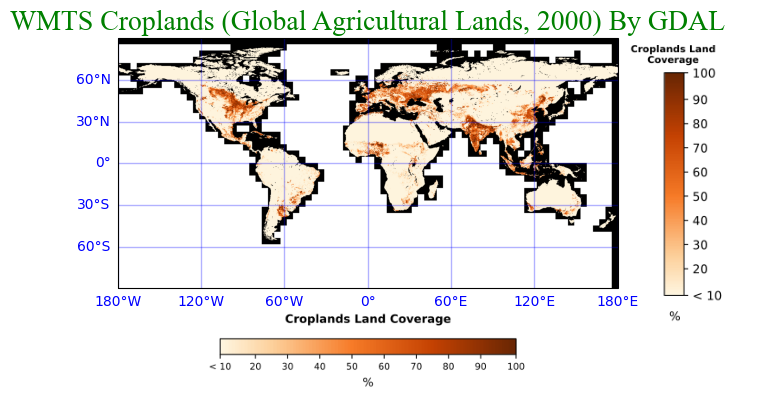

In [24]:
# cairosvg will be needed to convert the legend from SVG to PNG
import cairosvg

# Run GDAL command.
cmd  = 'gdal_translate -of PNG -outsize 1200 600 -projwin -180 90 180 -90 python-examples/globe_cropland.xml python-examples/globe_cropland.png'
os.system(cmd)

# Output image is globe_cropland.png.
img = plimg.open('python-examples/globe_cropland.png')

# Setup map size and projection.
fig = plt.figure(figsize = (5, 10), dpi = 100)
ax = plt.axes([1, 1, 1, 1], projection = ccrs.PlateCarree(central_longitude = 0))
ax.set_xlim([-180, 180])
ax.set_ylim([-90, 90])

# Display image on map.
imgExtent = (-180,180,-90,90)
cmp = plt.imshow(img, extent = imgExtent)

# Draw grid.
gl = ax.gridlines(ccrs.PlateCarree(), linewidth = 1, color = 'blue', alpha = 0.3, draw_labels = True)
gl.top_labels = False
gl.right_labels = False
gl.xlines = True
gl.ylines = True
gl.ylocator = mticker.FixedLocator([-90, -60, -30, 0, 30, 60, 90])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlabel_style = {'color': 'blue'}
gl.ylabel_style = {'color': 'blue'}

plt.title('WMTS Croplands (Global Agricultural Lands, 2000) By GDAL',\
        fontname = "Times New Roman", fontsize = 20, color = 'green')

# Horizontal legend:
# Get the legend image from the URL and convert it to PNG
legend_png_h = cairosvg.svg2png(urllib.request.urlopen(legendURLHorizontal).read())
# Convert to numpy array for matplotlib
legendImgArr_h = np.array(plimg.open(BytesIO(legend_png_h)))

# use data coordinates to specify the position and dimensions of new inset axes
axin_h = ax.inset_axes([-125,-260,250,250],transform=ax.transData)
axin_h.imshow(legendImgArr_h)
axin_h.axis('off')

# Vertical legend:
# Get the legend image from the URL and convert it to PNG
legend_png_v = cairosvg.svg2png(urllib.request.urlopen(legendURLVertical).read())
# Convert to numpy array for matplotlib
legendImgArr_v = np.array(plimg.open(BytesIO(legend_png_v)))

# use data coordinates to specify the position and dimensions of new inset axes
axin_v = ax.inset_axes([135,-115,200,200],transform=ax.transData)
axin_v.imshow(legendImgArr_v)
axin_v.axis('off')

plt.show()

print('')

## Examples of Analysis and Application

_NOTE: Numerical analyses performed on imagery should only be used for initial basic exploratory purposes. Results from these analyses should not be used for formal scientific study since the imagery is generally of lower precision than the original data and has often had additional processing steps applied to it, e.g. projection into a different coordinate system._

<a id="colormap_analysis"></a>

### Numerical Analysis of GIBS ColorMap

<DIV align="left" style="line-height:1.5em;">
<p>

These examples each perform a numerical analysis of a layer using its associated colormap.

We will again use `WmtsTree`, which was previously created in the <a href="#display_wmts_all_layers">Display WMTS All Layers of capabilities</a> example from the XML tree returned by the WMTS GetCapabilities request.

</p>
</DIV>

#### Histogram of Percent Cropland

<DIV align="left" style="line-height:1.5em;">
<p>

For this example, we will use "globe_cropland.png", which was previously created by GDAL in the <a href="#visualize_wmts_raster_data_legend">"Visualize WMTS Raster Data with a Legend"</a> example. 

*Note: for analylizing a raster image with a colormap, be sure to use a PNG format, as JPEG compression artifacts can yield inaccurate results.*

</p>
</DIV>

ColorMap URL: https://gibs.earthdata.nasa.gov/colormaps/v1.3/Agricultural_Lands_Croplands_2000.xml


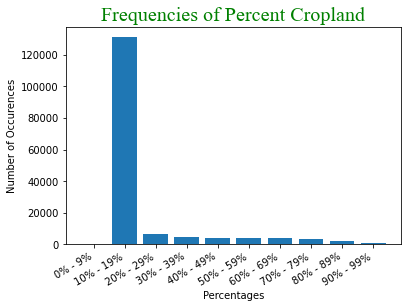

In [25]:
from collections import Counter, OrderedDict
import re
import math

layerName = "Agricultural_Lands_Croplands_2000"
colormapURL = None

# Get the colormap URL by searching the GetCapabilities XML tree
for child in WmtsTree.iter():
    for layer in child.findall("./{http://www.opengis.net/wmts/1.0}Layer"): 
         if '{http://www.opengis.net/wmts/1.0}Layer' == layer.tag: 
            f = layer.find("{http://www.opengis.net/ows/1.1}Identifier")
            if f is not None:
                if f.text == layerName:     
                    # Metadata tags
                    e = layer.findall("{http://www.opengis.net/ows/1.1}Metadata")
                    for metadataTag in e:
                        if metadataTag.attrib["{http://www.w3.org/1999/xlink}role"] == "http://earthdata.nasa.gov/gibs/metadata-type/colormap/1.3":
                            colormapURL = metadataTag.attrib["{http://www.w3.org/1999/xlink}href"]
print("ColorMap URL:", colormapURL)

# Obtain and read the colormap XML
response = requests.get(colormapURL)
colormapXML = xmltree.fromstring(response.content)

# Create a dictionary to be used to map RGB values to their bin names
rgb_bin_map = {}

colormaps = colormapXML.getroottree().findall("ColorMap")
for cmap in colormaps:
    if cmap.attrib["title"] == "Croplands Land Coverage":
        entries = cmap.find("Entries").findall("ColorMapEntry")
        for entry in entries:
            # Parse RGB values from string to 3-tuple of ints
            rgb_tuple = tuple(map(int, entry.attrib['rgb'].split(',')))
            # Parse the value's range string in the format [<lower_decimal>,<upper_decimal>)
            value_match = re.match(r'\[(\d+\.\d+),(\d+\.\d+)\)', entry.attrib['value'])
            if value_match:
                # Our bins will have ranges of 0.1 because our dataset goes from 0.0 to 1.0.
                # Construct the value's bin name:
                # (1) Floor the decimal component of the lower bound
                lowerbound_decimal = float(value_match.group(1).split('.')[1])
                lowerbound_floored = math.floor(lowerbound_decimal * 0.1)
                # (2) Create a string for the lower bound
                lowerbin_str = str(lowerbound_floored * 10)
                # (3) Obtain the upper bound as a string
                upperbin_str = str(int(lowerbin_str) + 9)

                # Assign the bin name to the RGB value in the dictionary
                bin_name = "{0}% - {1}%".format(lowerbin_str, upperbin_str)
                rgb_bin_map[rgb_tuple] = bin_name
                

# Create a list keeping track of each pixel's bin
percents = []

# Search the image for occurrences of each color
# First, open the image that GDAL created in the "Visualize WMTS Raster Data with a Legend" example
map_img = plimg.open("python-examples/globe_cropland.png")

# Iterate over the image and put pixels in bins
for x in range(map_img.width):
    for y in range(map_img.height):
        # Use rgb_bins to map the RGB value to its corresponding bin name
        try:
            bin_name = rgb_bin_map[map_img.getpixel((x,y))]
            percents.append(bin_name)
        # "No Data" values are ignored
        except KeyError:
            pass

# Sort the list of bin names to guarentee that the bar chart x-axis will be properly ordered
bin_names = list(rgb_bin_map.values())
bin_names.sort()

# Create an OrderedDict to maintain the sorted order with a default count of 0 for each bin.
# The default count of 0 guarentees each bin a spot on the chart even if it's empty.
rgbs_count = OrderedDict.fromkeys(bin_names, 0)
# Calculate the count of each bin's contents and merge into the OrderedDict.
rgbs_count.update(dict(Counter(percents)))

# Create the plot
fig, axes = plt.subplots()
axes.bar(rgbs_count.keys(), rgbs_count.values())
plt.title('Frequencies of Percent Cropland',\
        fontname = "Times New Roman", fontsize = 20, color = 'green')
plt.xlabel("Percentages")
plt.ylabel("Number of Occurences")
plt.setp(axes.get_xticklabels(), rotation=30, horizontalalignment='right');

#### Percentages of Land Cover Types

<DIV align="left" style="line-height:1.5em;">
<p>

For this example, we will first create "globe_land_cover.png" by following the process used in <a href="#visualize_wmts_raster_data_legend">"Visualize WMTS Raster Data with a Legend"</a> example, then analyze it in a similar fashion to the previous example.

We will use globe_land_cover.xml (printed below) as input for GDAL.
</p>
</DIV>

In [26]:
# Make GDAL input XML file like globe_land_cover.xml below.
xml = xmltree.parse("python-examples/globe_land_cover.xml")
pretty = xmltree.tostring(xml, encoding="unicode", pretty_print=True)
print(pretty)

<GDAL_WMS>
    <Service name="TMS">
        <ServerUrl>https://gibs.earthdata.nasa.gov/wmts/epsg4326/best/MODIS_Combined_L3_IGBP_Land_Cover_Type_Annual/default/default/500m/${z}/${y}/${x}.png</ServerUrl>
    </Service>
    <Transparent>TRUE</Transparent>
    <DataWindow>
        <UpperLeftX>-180.0</UpperLeftX>
        <UpperLeftY>90</UpperLeftY>
        <LowerRightX>396.0</LowerRightX>
        <LowerRightY>-198</LowerRightY>
        <TileLevel>8</TileLevel>
        <TileCountX>2</TileCountX>
        <TileCountY>1</TileCountY>
        <YOrigin>top</YOrigin>
    </DataWindow>
    <BlockSizeX>512</BlockSizeX>
    <BlockSizeY>512</BlockSizeY>
    <Projection>EPSG:4326</Projection>
    <BandsCount>3</BandsCount>
</GDAL_WMS>



<DIV align="left" style="line-height:1.5em;">
<p>

Next, we'll visualize the map image that we will be analyzing along with its legend, following the processes established by the <a href="display_legends_wmts">"Display Legends for a WMTS Layer"</a> example and the <a href="#visualize_wmts_raster_data_legend">"Visualize WMTS Raster Data with a Legend"</a> example.

</p>
</DIV>

Input file size is 262144, 131072
0...10...20...30...40...50...60...70...80...90...100 - done.


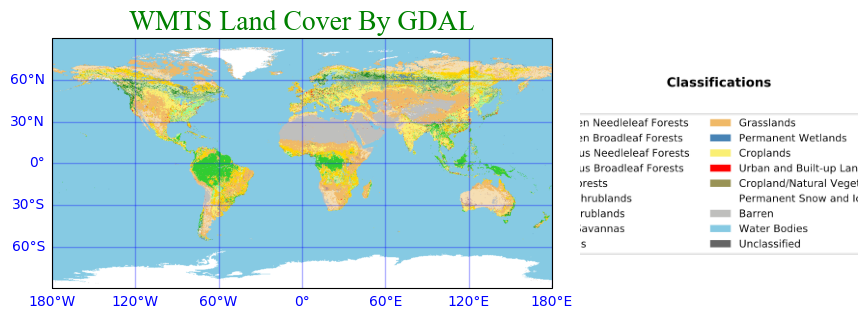

In [27]:
# Run GDAL command.
cmd  = 'gdal_translate -of PNG -outsize 1200 600 -projwin -180 90 180 -90 python-examples/globe_land_cover.xml python-examples/globe_land_cover.png'
os.system(cmd)

# Output image is globe_land_cover.png.
img = plimg.open('python-examples/globe_land_cover.png')

# Setup map size and projection.
fig = plt.figure(figsize = (5, 10), dpi = 100)
ax = plt.axes([1, 1, 1, 1], projection = ccrs.PlateCarree(central_longitude = 0))
ax.set_xlim([-180, 180])
ax.set_ylim([-90, 90])

# Display image on map.
imgExtent = (-180,180,-90,90)
cmp = plt.imshow(img, extent = imgExtent)

# Draw grid.
gl = ax.gridlines(ccrs.PlateCarree(), linewidth = 1, color = 'blue', alpha = 0.3, draw_labels = True)
gl.top_labels = False
gl.right_labels = False
gl.xlines = True
gl.ylines = True
gl.ylocator = mticker.FixedLocator([-90, -60, -30, 0, 30, 60, 90])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlabel_style = {'color': 'blue'}
gl.ylabel_style = {'color': 'blue'}

plt.title('WMTS Land Cover By GDAL',\
        fontname = "Times New Roman", fontsize = 20, color = 'green')

# Obtain and display Legend:

# First obtain the legend's URL
layerName = "MODIS_Combined_L3_IGBP_Land_Cover_Type_Annual"
legendURL = None

# Parse layer attributes and vector information.
for child in WmtsTree.iter():
    for layer in child.findall("./{http://www.opengis.net/wmts/1.0}Layer"): 
         if '{http://www.opengis.net/wmts/1.0}Layer' == layer.tag: 
            f = layer.find("{http://www.opengis.net/ows/1.1}Identifier")
            if f is not None:
                if f.text == layerName:                    
                    # Style tag
                    e = layer.find("{http://www.opengis.net/wmts/1.0}Style")
                    if e is not None:
                        for legendTag in e.findall("{http://www.opengis.net/wmts/1.0}LegendURL"):
                            legendURL = legendTag.attrib["{http://www.w3.org/1999/xlink}href"]

# Next, get the legend image from the URL and convert it to PNG
legend_png= cairosvg.svg2png(urllib.request.urlopen(legendURL).read())
# Convert to numpy array for matplotlib
legendImgArr = np.array(plimg.open(BytesIO(legend_png)))

# use data coordinates to specify the position and dimensions of new inset axes
axin = ax.inset_axes([200,-115,200,200],transform=ax.transData)
axin.imshow(legendImgArr)
axin.axis('off')

plt.show()

print('')

Finally, we will make a chart showing the percentages of the types of land coverage.

ColorMap URL: https://gibs.earthdata.nasa.gov/colormaps/v1.3/MODIS_IGBP_Land_Cover_Type.xml


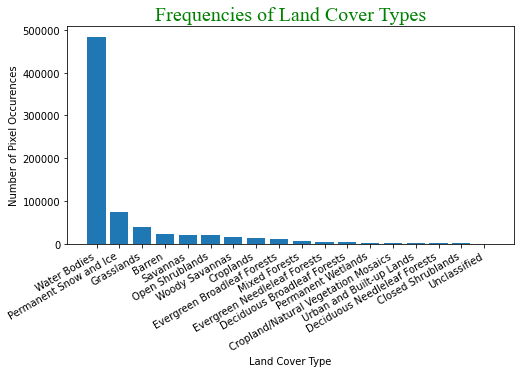

In [28]:
# First obtain the colormap's URL
layerName = "MODIS_Combined_L3_IGBP_Land_Cover_Type_Annual"
colormapURL = None

# Get the colormap URL by searching the GetCapabilities XML tree
for child in WmtsTree.iter():
    for layer in child.findall("./{http://www.opengis.net/wmts/1.0}Layer"): 
         if '{http://www.opengis.net/wmts/1.0}Layer' == layer.tag: 
            f = layer.find("{http://www.opengis.net/ows/1.1}Identifier")
            if f is not None:
                if f.text == layerName:     
                    # Metadata tags
                    e = layer.findall("{http://www.opengis.net/ows/1.1}Metadata")
                    for metadataTag in e:
                        if metadataTag.attrib["{http://www.w3.org/1999/xlink}role"] == "http://earthdata.nasa.gov/gibs/metadata-type/colormap/1.3":
                            colormapURL = metadataTag.attrib["{http://www.w3.org/1999/xlink}href"]
print("ColorMap URL:", colormapURL)

# Obtain and read the colormap XML
response = requests.get(colormapURL)
colormapXML = xmltree.fromstring(response.content)

# Search the image for occurrences of each color
# First, open the image that GDAL created earlier
map_img = plimg.open("python-examples/globe_land_cover.png")

# Create a dictionary to keep track of the number of occurences of each pixel
landCoverRGBCounts = {}

# Iterate over the image and count the number of occurences of each pixel
for x in range(map_img.width):
    for y in range(map_img.height):
        landCoverRGBCounts[map_img.getpixel((x,y))] = landCoverRGBCounts.get(map_img.getpixel((x,y)), 0) + 1

# Map the RGB values to their corresponding land cover type
# Create a dictionary to be used to map RGB values and their counts to their land cover types
landCoverTypeCounts = {}

colormaps = colormapXML.getroottree().findall("ColorMap")
for cmap in colormaps:
    if cmap.attrib["title"] == "Classifications":
        entries = cmap.find("Legend").findall("LegendEntry")
        for entry in entries:
            # Parse RGB values from string to 3-tuple of ints
            rgb_tuple = tuple(map(int, entry.attrib['rgb'].split(',')))
            landCoverTypeCounts[entry.attrib['tooltip']] = landCoverRGBCounts[rgb_tuple]

# Sort the result using an ordered dictionary
landCoverSorted = OrderedDict(sorted(landCoverTypeCounts.items(), key=lambda x: x[1], reverse=True))

# Create the plot
fig, axes = plt.subplots()
axes.bar(landCoverSorted.keys(), landCoverSorted.values())
plt.title('Frequencies of Land Cover Types',\
        fontname = "Times New Roman", fontsize = 20, color = 'green')
plt.xlabel("Land Cover Type")
plt.ylabel("Number of Pixel Occurences")
fig.set_figwidth(8)
plt.setp(axes.get_xticklabels(), rotation=30, horizontalalignment='right');

It is clear from the plot above that most of the Earth's surface is covered by water bodies, which is not surprising.

It may be more interesting to view the data with "Water Bodies" omitted and using percentages rather than pixel frequencies for the y-axis:

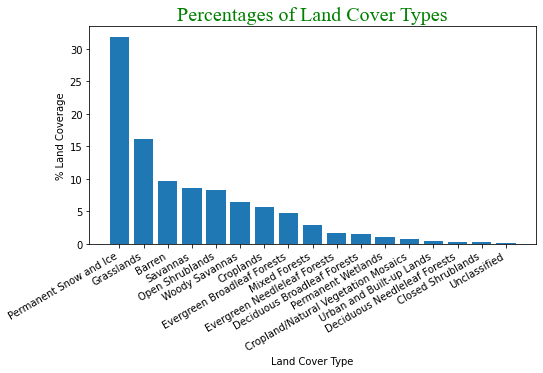

In [29]:
# Remove "Water Bodies"
landCoverWithoutWater = landCoverSorted.copy()
landCoverWithoutWater.pop("Water Bodies")

landCoverWithoutWaterPercentages = [x / sum(landCoverWithoutWater.values()) * 100 for x in landCoverWithoutWater.values()]

fig, axes = plt.subplots()
axes.bar(landCoverWithoutWater.keys(), landCoverWithoutWaterPercentages)
plt.title('Percentages of Land Cover Types',\
        fontname = "Times New Roman", fontsize = 20, color = 'green')
plt.xlabel("Land Cover Type")
plt.ylabel("% Land Coverage")
fig.set_figwidth(8)
plt.setp(axes.get_xticklabels(), rotation=30, horizontalalignment='right');

<a id='image_analysis'></a>

### Image Analysis

<DIV align="left" style="line-height:1.5em;">
<p>

This example performs an analysis of a satellite image using the various bands to determine interesting info.

We will again use `WmtsTree`, which was previously created in the <a href="#display_wmts_all_layers">Display WMTS All Layers of capabilities</a> example from the XML tree returned by the WMTS GetCapabilities request.

For this example, we will first create "globe_bands367.png" by following the process used in <a href="#visualize_wmts_raster_data_legend">"Visualize WMTS Raster Data with a Legend"</a> example, then analyze it to determine the approximate proportions of its most frequent colors.

We will use globe_bands367.xml (printed below) as input for GDAL.

</p>
</DIV>

In [30]:
# Make GDAL input XML file like globe_bands367.xml below.
xml = xmltree.parse("python-examples/globe_bands367.xml")
pretty = xmltree.tostring(xml, encoding="unicode", pretty_print=True)
print(pretty)

<GDAL_WMS>
    <Service name="TMS">
        <ServerUrl>https://gibs.earthdata.nasa.gov/wmts/epsg4326/best/MODIS_Terra_CorrectedReflectance_Bands367/default/2021-09-25/250m/${z}/${y}/${x}.jpg</ServerUrl>
    </Service>
    <Transparent>TRUE</Transparent>
    <DataWindow>
        <UpperLeftX>-180.0</UpperLeftX>
        <UpperLeftY>90</UpperLeftY>
        <LowerRightX>396.0</LowerRightX>
        <LowerRightY>-198</LowerRightY>
        <TileLevel>8</TileLevel>
        <TileCountX>2</TileCountX>
        <TileCountY>1</TileCountY>
        <YOrigin>top</YOrigin>
    </DataWindow>
    <BlockSizeX>512</BlockSizeX>
    <BlockSizeY>512</BlockSizeY>
    <Projection>EPSG:4326</Projection>
    <BandsCount>3</BandsCount>
</GDAL_WMS>



<DIV align="left" style="line-height:1.5em;">
<p>

Next, we'll visualize the map image that we will be analyzing following the process established by the <a href="visualize_wmts_raster_data">"Visualize WMTS Raster Data By GDAL"</a> example.

</p>
</DIV>

Input file size is 262144, 131072
0...10...20...30...40...50...60...70...80...90...100 - done.


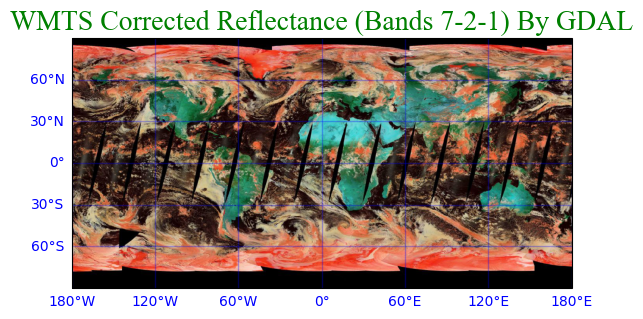

In [31]:
# Run GDAL command.
cmd  = 'gdal_translate -of PNG -outsize 1200 600 -projwin -180 90 180 -90 python-examples/globe_bands367.xml python-examples/globe_bands367.png'
os.system(cmd)

# Output image is globe_bands367.png.
img = plimg.open('python-examples/globe_bands367.png')

# Setup map size and projection.
fig = plt.figure(figsize = (5, 10), dpi = 100)
ax = plt.axes([1, 1, 1, 1], projection = ccrs.PlateCarree(central_longitude = 0))
ax.set_xlim([-180, 180])
ax.set_ylim([-90, 90])

# Display image on map.
imgExtent = (-180,180,-90,90)
cmp = plt.imshow(img, extent = imgExtent)

# Draw grid.
gl = ax.gridlines(ccrs.PlateCarree(), linewidth = 1, color = 'blue', alpha = 0.3, draw_labels = True)
gl.top_labels = False
gl.right_labels = False
gl.xlines = True
gl.ylines = True
gl.ylocator = mticker.FixedLocator([-90, -60, -30, 0, 30, 60, 90])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlabel_style = {'color': 'blue'}
gl.ylabel_style = {'color': 'blue'}

plt.title('WMTS Corrected Reflectance (Bands 7-2-1) By GDAL',\
        fontname = "Times New Roman", fontsize = 20, color = 'green')

plt.show();

Using K-Means clustering, we will find the most prominent colors and the percentages of the image that they make up and visualize them in a plot below.

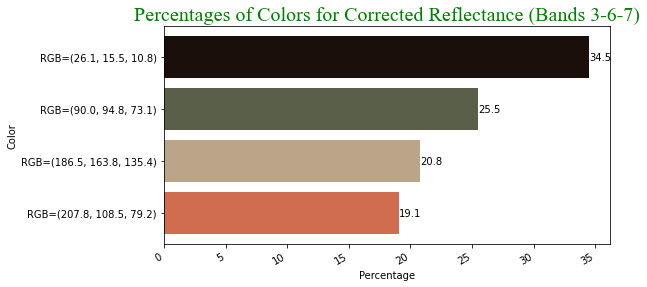

In [32]:
# We'll be using KMeans clustering to perform the analysis
from sklearn.cluster import KMeans
from collections import Counter

# First, open the image that GDAL created in the example above as a numpy array
map_img = np.asarray(plimg.open("python-examples/globe_bands367.png"))
# map_img is currently a 3D array, with dimensions of row, column, and pixel values.
# Reshape it to form a 2D array of pixel values, with row and column positions disregarded.
map_pixels = map_img.reshape(-1, 3)

# Next, use KMeans clustering to find the most common colors in the image
clustering = KMeans(n_clusters = 4, random_state=1)
clustering.fit(map_pixels)

# Calculate the percentage of pixels that each cluster contains
total_pixels = len(clustering.labels_)
counter = Counter(clustering.labels_)
color_percents = []
for i in counter:
    # Create a list of (color, percentage) tuples
    color_percents.append((tuple(clustering.cluster_centers_[i]), np.round(counter[i]/total_pixels, 3) * 100))

# Sort the colors and the percents together based on the percents
color_percents_sorted = sorted(color_percents, key=lambda x: x[1], reverse=False)
# Obtain the sorted list of colors
colors = [x[0] for x in color_percents_sorted]
# Obtain the sorted list of percents
percents = [x[1] for x in color_percents_sorted]

# Obtain the RGB values on scale of [0,1] for Matplotlib to assign to each bar in the chart
colors_01 = [tuple(map(lambda y: y / 255, x)) for x in colors]

# Obtain properly formatted labels for each bar
labels = list(map(lambda x: "RGB=({:.1f}, {:.1f}, {:.1f})".format(x[0],x[1],x[2]), colors))

# Create the plot
fig, axes = plt.subplots()
bar = axes.barh(labels, percents, color = colors_01)
axes.bar_label(bar)
plt.title('Percentages of Colors for Corrected Reflectance (Bands 3-6-7)',\
        fontname = "Times New Roman", fontsize = 20, color = 'green')
plt.ylabel("Color")
plt.xlabel("Percentage")
fig.set_figwidth(8)
plt.setp(axes.get_xticklabels(), rotation=30, horizontalalignment='right');

<a id="color_plot_1"></a>
The plot above shows the k most abundant mean colors in the plot. From the description of this layer in [Worldview](https://worldview.earthdata.nasa.gov/?v=-128.52526865006644,-29.605511562718895,13.10389415248764,42.48766644719232&l=MODIS_Terra_CorrectedReflectance_Bands367&lg=true&t=2021-09-25-T21%3A03%3A33Z), we have a general idea of what these colors represent:
* The near-black color (RGB: 26.1, 15.5, 10.8) comprises such a comparatively large percentage of the image likely because it would include not only the oceans (liquid water appears very dark) but also the areas of no data, where the Terra satellite did not pass over on the day this imagery was acquired.
* The dark green color (RGB: 90.0, 94.8, 73.1) is likely comprised of the green vegetation color and some of the dark liquid water color.
* The tan color likely corresponds to the combination of some of the lightest colors, including the white color representing liquid water droplets suspended in the air by clouds, the "reddish-orange or peach" color of the small ice crystals suspended in high-level clouds, and the bright cyan color that corresponds to deserts.
* The reddish-orange (RGB: 207.8, 108.5, 79.2) represents ice crystals, which includes snow, ice, and high-altitude clouds.

We can visualize this further by creating a new version of the map image with each pixel assigned to the mean color of the cluster that it was assigned to.

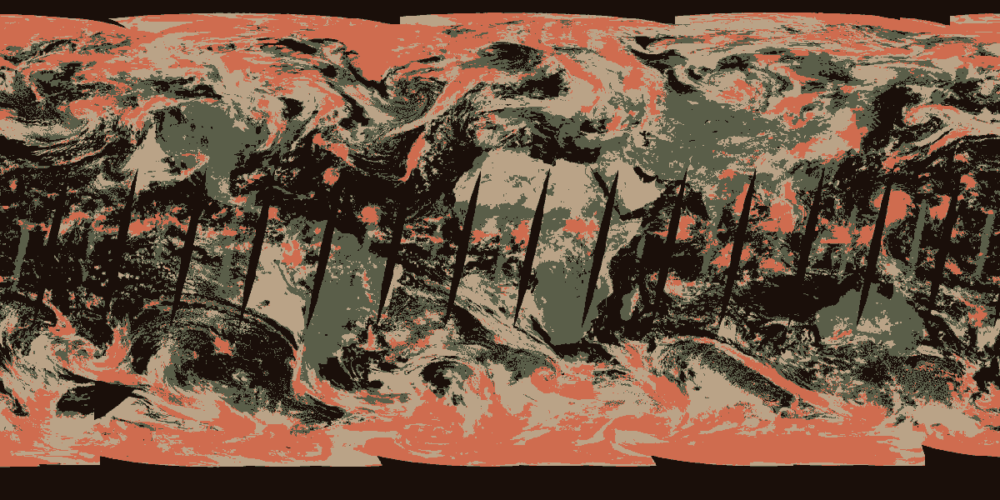

In [33]:
img = plimg.open("python-examples/globe_bands367.png")
outimg = img.copy()
# Reshape the list of labels from a 1-D array to match the shape of the image's dimensions
labels_matrix = clustering.labels_.reshape(np.asarray(img).shape[:2])
# Assign each pixel the color specified by its corresponding label
for y in range(outimg.height):
    for x in range(outimg.width):
        outimg.putpixel((x,y), tuple(clustering.cluster_centers_[labels_matrix[y, x]].astype(int)))
display(outimg)

### Using a Mask

<DIV align="left" style="line-height:1.5em;">
<p>

There are many instances where masks can be useful to highlight or exclude certain areas of the globe from analysis.
</p>
</DIV>

#### Using a "No Data" Mask

First, we will use the MODIS_Terra_Data_No_Data layer to highlight areas of the imagery used in the previous example. To first visualize this mask, we'll display the mask over the base map image layer from the previous example by following the process established by the <a href="#basic_wms_connection">"Basic WMS Connection"</a> example.



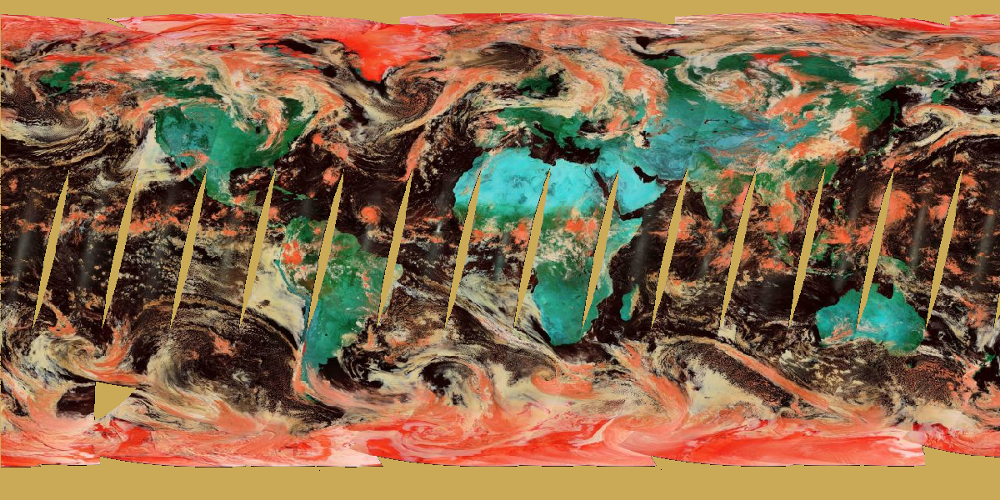

In [34]:
# Connect to GIBS WMS Service
wms = WebMapService('https://gibs.earthdata.nasa.gov/wms/epsg4326/best/wms.cgi?', version='1.1.1')

# Configure request for MODIS_Terra_CorrectedReflectance_Bands367 and MODIS_Terra_Data_No_Data
img = wms.getmap(layers=['MODIS_Terra_CorrectedReflectance_Bands367', 'MODIS_Terra_Data_No_Data'],  # Layers
                 srs='epsg:4326',  # Map projection
                 bbox=(-180,-90,180,90),  # Bounds
                 size=(1200, 600),  # Image size
                 time='2021-09-25',  # Time of data
                 format='image/png',  # Image format
                 transparent=True)  # Nodata transparency

Image(img.read())

Next, we can perform the same image analysis as used in the <a href="#image_analysis">"Image Analysis"</a> example, this time using the OSM_Land_Mask and the MODIS_Terra_Data_No_Data mask to limit the analysis to only the oceans.

We will use WMTS for this, as the colormap available to us with WMTS will provide the information on what pixels correspond to the mask for each layer mask.

First, we will use globe_bands367.xml and modis_terra_nodata_mask.xml with GDAL to obtain the mask layer images.

globe_bands367.xml was already defined in the "Image Analysis" example. modis_terra_nodata_mask.xml is printed below.

In [35]:
# Make GDAL input XML files like modis_terra_nodata_mask.xml and osm_land_mask.xml below.
nodata_xml = xmltree.parse("python-examples/modis_terra_nodata_mask.xml")
nodata_pretty = xmltree.tostring(nodata_xml, encoding="unicode", pretty_print=True)
print("modis_terra_nodata_mask.xml:")
print(nodata_pretty)

modis_terra_nodata_mask.xml:
<GDAL_WMS>
    <Service name="TMS">
        <ServerUrl>https://gibs.earthdata.nasa.gov/wmts/epsg4326/best/MODIS_Terra_Data_No_Data/default/2021-09-25/250m/${z}/${y}/${x}.png</ServerUrl>
    </Service>
    <Transparent>TRUE</Transparent>
    <DataWindow>
        <UpperLeftX>-180.0</UpperLeftX>
        <UpperLeftY>90</UpperLeftY>
        <LowerRightX>396.0</LowerRightX>
        <LowerRightY>-198</LowerRightY>
        <TileLevel>8</TileLevel>
        <TileCountX>2</TileCountX>
        <TileCountY>1</TileCountY>
        <YOrigin>top</YOrigin>
    </DataWindow>
    <BlockSizeX>512</BlockSizeX>
    <BlockSizeY>512</BlockSizeY>
    <Projection>EPSG:4326</Projection>
    <BandsCount>3</BandsCount>
</GDAL_WMS>



Next, we'll obtain the image file for each layer with GDAL, and then analyze the colors of the Corrected Reflectance (Bands 7-2-1) layer as done in the "Image Analysis" example while skipping any pixel that doesn't have an RGB value of 0,0,0 in the no data mask.

Input file size is 262144, 131072
0...10...20...30...40...50...60...70...80...90...100 - done.
Input file size is 262144, 131072
0...10...20...30...40...50...60...70...80...90...100 - done.


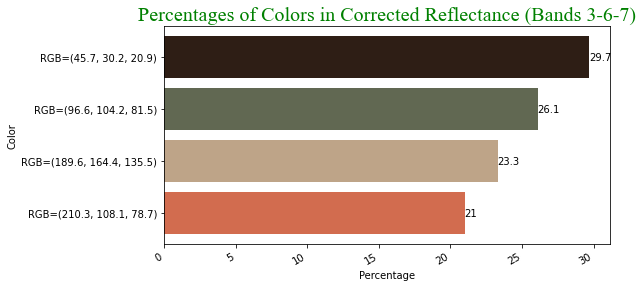

In [36]:
# Run GDAL commands to download the images.
cmd  = 'gdal_translate -of PNG -outsize 1200 600 -projwin -180 90 180 -90 python-examples/globe_bands367.xml python-examples/globe_bands367.png'
os.system(cmd)

cmd  = 'gdal_translate -of PNG -outsize 1200 600 -projwin -180 90 180 -90 python-examples/modis_terra_nodata_mask.xml python-examples/modis_terra_nodata_mask.png'
os.system(cmd)

# First, open each image that GDAL created above as a numpy array
map_img = np.asarray(plimg.open("python-examples/globe_bands367.png"))
nodata_img = np.asarray(plimg.open("python-examples/modis_terra_nodata_mask.png"))
# map_img and nodata_img are currently 3D arrays, with dimensions of row, column, and pixel values.
# Reshape it to form a 2D array of pixel values, with row and column positions disregarded.
map_pixels = map_img.reshape(-1, 3)
nodata_pixels = nodata_img.reshape(-1, 3)

# Filter map_pixels such that any pixels that do not have values of 0,0,0 in landmask_img or nodata_img are eliminated.
# Create a filter array for each mask
make_filter = lambda p: np.array_equal(p,np.array([0,0,0]))
nodata_filter = np.apply_along_axis(make_filter, 1, nodata_pixels)
# filter the pixels
filtered_pixels = map_pixels[nodata_filter]

# Use KMeans clustering to find the most common colors in the image
clustering = KMeans(n_clusters = 4, random_state=1)
clustering.fit(filtered_pixels)

# Calculate the percentage of pixels that each cluster contains
total_pixels = len(clustering.labels_)
counter = Counter(clustering.labels_)
color_percents = []
for i in counter:
    # Create a list of (color, percentage) tuples
    color_percents.append((tuple(clustering.cluster_centers_[i]), np.round(counter[i]/total_pixels, 3) * 100))

# Sort the colors and the percents together based on the percents
color_percents_sorted = sorted(color_percents, key=lambda x: x[1], reverse=False)
# Obtain the sorted list of colors
colors = [x[0] for x in color_percents_sorted]
# Obtain the sorted list of percents
percents = [x[1] for x in color_percents_sorted]

# Obtain the RGB values on scale of [0,1] for Matplotlib to assign to each bar in the chart
colors_01 = [tuple(map(lambda y: y / 255, x)) for x in colors]

# Obtain properly formatted labels for each bar
labels = list(map(lambda x: "RGB=({:.1f}, {:.1f}, {:.1f})".format(x[0],x[1],x[2]), colors))

# Create the plot
fig, axes = plt.subplots()
bar = axes.barh(labels, percents, color = colors_01)
axes.bar_label(bar)
plt.title('Percentages of Colors in Corrected Reflectance (Bands 3-6-7)',\
        fontname = "Times New Roman", fontsize = 20, color = 'green')
plt.ylabel("Color")
plt.xlabel("Percentage")
fig.set_figwidth(8)
plt.setp(axes.get_xticklabels(), rotation=30, horizontalalignment='right');

As compared to the <a href="#color_plot_1">previous example of this plot</a>, the darkest color has a smaller percentage now that all of the dark "no data" pixels have been excluded from the analysis.

#### Using a Land Mask

In a similar fashion to the "no data" mask, we can also add a land mask to only view ocean areas:

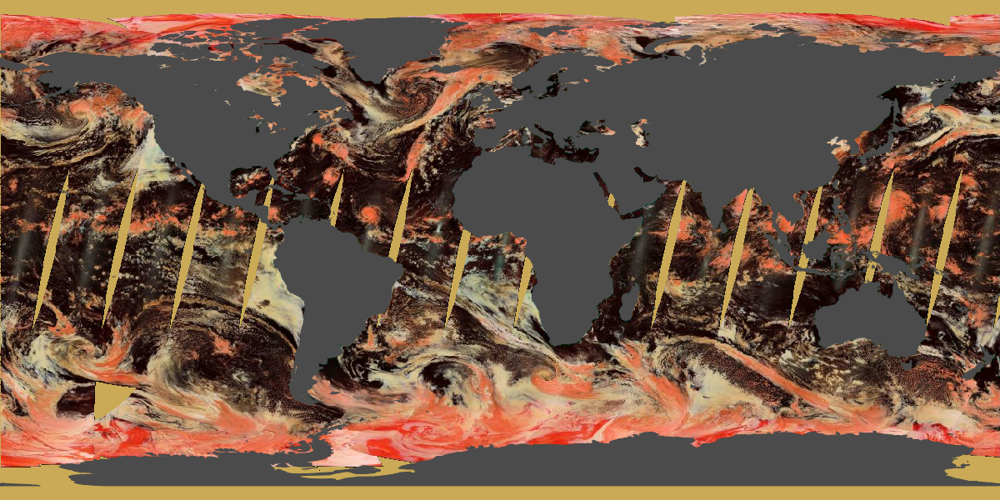

In [37]:
# Configure request for MODIS_Terra_CorrectedReflectance_Bands367 and MODIS_Terra_L3_Land_Water_Mask
nodata_land_mask_img = wms.getmap(layers=['MODIS_Terra_CorrectedReflectance_Bands367',
                                          'MODIS_Terra_Data_No_Data',
                                          'OSM_Land_Mask'],  # Layers
                 srs='epsg:4326',  # Map projection
                 bbox=(-180,-90,180,90),  # Bounds
                 size=(1200, 600),  # Image size
                 time='2021-09-25',  # Time of data
                 format='image/png',  # Image format
                 transparent=True)  # Nodata transparency

Image(nodata_land_mask_img.read())

We will repeat the image analysis procedure used in the previous example, this time using both the "No Data" mask and the land mask. Once again, start by creating osm_land_mask.xml as it is printed below.

In [38]:
landmask_xml = xmltree.parse("python-examples/osm_land_mask.xml")
landmask_pretty = xmltree.tostring(landmask_xml, encoding="unicode", pretty_print=True)
print("osm_land_mask.xml:")
print(landmask_pretty)

osm_land_mask.xml:
<GDAL_WMS>
    <Service name="TMS">
        <ServerUrl>https://gibs.earthdata.nasa.gov/wmts/epsg4326/best/OSM_Land_Mask/default/250m/${z}/${y}/${x}.png</ServerUrl>
    </Service>
    <Transparent>TRUE</Transparent>
    <DataWindow>
        <UpperLeftX>-180.0</UpperLeftX>
        <UpperLeftY>90</UpperLeftY>
        <LowerRightX>396.0</LowerRightX>
        <LowerRightY>-198</LowerRightY>
        <TileLevel>8</TileLevel>
        <TileCountX>2</TileCountX>
        <TileCountY>1</TileCountY>
        <YOrigin>top</YOrigin>
    </DataWindow>
    <BlockSizeX>512</BlockSizeX>
    <BlockSizeY>512</BlockSizeY>
    <Projection>EPSG:4326</Projection>
    <BandsCount>3</BandsCount>
</GDAL_WMS>



Next, we'll obtain the image file for the land mask with GDAL, and then analyze the colors of the Corrected Reflectance (Bands 7-2-1) layer as done in the earlier example while skipping any pixel that doesn't have an RGB value of 0,0,0 in both the land mask and the no data mask.

Input file size is 262144, 131072
0...10...20...30...40...50...60...70...80...90...100 - done.


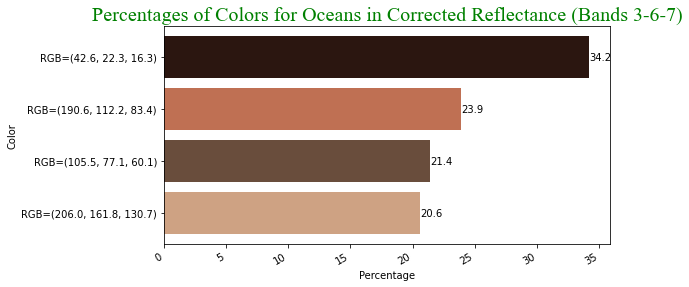

In [39]:
# Run GDAL commands to download the OSM Land Mask image (the other layer images were already downloaded)
cmd  = 'gdal_translate -of PNG -outsize 1200 600 -projwin -180 90 180 -90 python-examples/osm_land_mask.xml python-examples/osm_land_mask.png'
os.system(cmd)

# First, open each image that GDAL created as a numpy array
map_img = np.asarray(plimg.open("python-examples/globe_bands367.png"))
landmask_img = np.asarray(plimg.open("python-examples/osm_land_mask.png"))
nodata_img = np.asarray(plimg.open("python-examples/modis_terra_nodata_mask.png"))
# map_img, landmask_img, and nodata_img are currently 3D arrays, with dimensions of row, column, and pixel values.
# Reshape it to form a 2D array of pixel values, with row and column positions disregarded.
map_pixels = map_img.reshape(-1, 3)
landmask_pixels = landmask_img.reshape(-1, 3)
nodata_pixels = nodata_img.reshape(-1, 3)

# Filter map_pixels such that any pixels that do not have values of 0,0,0 in landmask_img or nodata_img are eliminated.
# Create a filter array for each mask
make_filter = lambda p: np.array_equal(p,np.array([0,0,0]))
landmask_filter = np.apply_along_axis(make_filter, 1, landmask_pixels)
nodata_filter = np.apply_along_axis(make_filter, 1, nodata_pixels)
# "and" the two filters together to create one final filter
complete_filter = np.logical_and(landmask_filter, nodata_filter)
# filter the pixels
filtered_pixels = map_pixels[complete_filter]

# Use KMeans clustering to find the most common colors in the image
clustering = KMeans(n_clusters = 4, random_state=1)
clustering.fit(filtered_pixels)

# Calculate the percentage of pixels that each cluster contains
total_pixels = len(clustering.labels_)
counter = Counter(clustering.labels_)
color_percents = []
for i in counter:
    # Create a list of (color, percentage) tuples
    color_percents.append((tuple(clustering.cluster_centers_[i]), np.round(counter[i]/total_pixels, 3) * 100))

# Sort the colors and the percents together based on the percents
color_percents_sorted = sorted(color_percents, key=lambda x: x[1], reverse=False)
# Obtain the sorted list of colors
colors = [x[0] for x in color_percents_sorted]
# Obtain the sorted list of percents
percents = [x[1] for x in color_percents_sorted]

# Obtain the RGB values on scale of [0,1] for Matplotlib to assign to each bar in the chart
colors_01 = [tuple(map(lambda y: y / 255, x)) for x in colors]

# Obtain properly formatted labels for each bar
labels = list(map(lambda x: "RGB=({:.1f}, {:.1f}, {:.1f})".format(x[0],x[1],x[2]), colors))

# Create the plot
fig, axes = plt.subplots()
bar = axes.barh(labels, percents, color = colors_01)
axes.bar_label(bar)
plt.title('Percentages of Colors for Oceans in Corrected Reflectance (Bands 3-6-7)',\
        fontname = "Times New Roman", fontsize = 20, color = 'green')
plt.ylabel("Color")
plt.xlabel("Percentage")
fig.set_figwidth(8)
plt.setp(axes.get_xticklabels(), rotation=30, horizontalalignment='right');

### Overlaying
You can overlay multiple images and change the transparency to get your desired outcome 

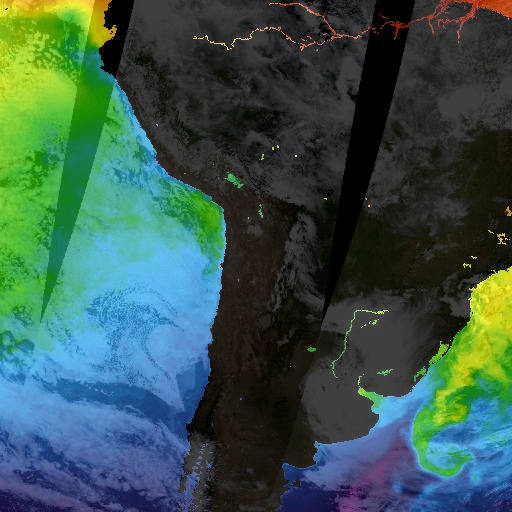

In [2]:
background_image_url = 'https://gibs.earthdata.nasa.gov/wms/epsg4326/best/wms.cgi?\
version=1.3.0&service=WMS&request=GetMap&\
format=image/jpeg&STYLE=default&bbox=-45,-90,0,-45&CRS=EPSG:4326&\
HEIGHT=512&WIDTH=512&TIME=2021-11-25&layers=MODIS_Terra_SurfaceReflectance_Bands143'

GHRSST_overlay_image_url = 'https://gibs.earthdata.nasa.gov/wms/epsg4326/best/wms.cgi?\
version=1.3.0&service=WMS&request=GetMap&\
format=image/jpeg&STYLE=default&bbox=-45,-90,0,-45&CRS=EPSG:4326&\
HEIGHT=512&WIDTH=512&TIME=2024-10-12&layers=GHRSST_L4_MUR_Sea_Surface_Temperature'

background = plimg.open(urllib.request.urlopen(background_image_url))
overlay = plimg.open(urllib.request.urlopen(GHRSST_overlay_image_url))

background = background.convert("RGBA")
overlay = overlay.convert("RGBA")

# .75 is the transparency for this example
GHRSST_Overlay = plimg.blend(background, overlay, .75)
GHRSST_Overlay.save("GHRSST_Overlay.png","PNG")

# View image
Image("GHRSST_Overlay.png")

You can overlay your Raster file with a Shapefile

In [3]:
# Create a box Shapefile 
# Define the bounding box over the continental US
minx, miny, maxx, maxy = -125, 25, -66, 50 

# Create a GeoDataFrame with the bounding box
geometry = [box(minx, miny, maxx, maxy)]
gdf = gpd.GeoDataFrame({"id": [1]}, geometry=geometry, crs="EPSG:4326")

gdf.to_file("us_box.shp")

# Save a global extents tiff file
# Connect to GIBS WMS Service
wms = WebMapService('https://gibs.earthdata.nasa.gov/wms/epsg4326/best/wms.cgi?', version='1.1.1')

# Configure request for MODIS_Terra_SurfaceReflectance_Bands143
img = wms.getmap(layers=['MODIS_Terra_SurfaceReflectance_Bands143'],  # Layers
                 srs='epsg:4326',  # Map projection
                 bbox=(-180,-90,180,90),  # Bounds
                 size=(3600, 1800),  # Image size
                 time='2021-11-25',  # Time of data
                 format='image/tiff',  # Image format
                 transparent=True)  # Nodata transparency

# Save output TIFF to a file
out = open('global_extents.tiff', 'wb')
out.write(img.read())
out.close()

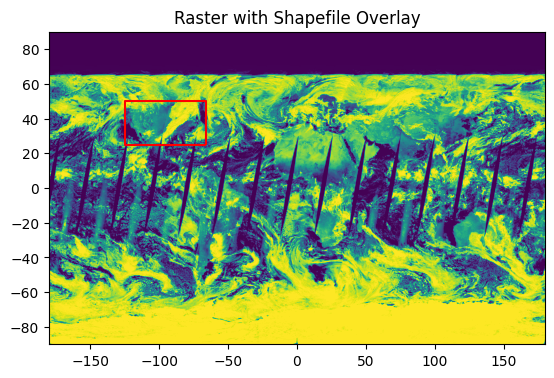

In [4]:
# Load the raster file
raster_path = "global_extents.tiff"
with rasterio.open(raster_path) as src:
    raster = src.read(1) 
    raster_transform = src.transform

# Plot the raster 
fig, axes = plt.subplots()
show(raster, transform=raster_transform, ax=axes)  

# Overlay the shapefile
gdf.boundary.plot(ax=axes, edgecolor="red")  

axes.set_title("Raster with Shapefile Overlay")
plt.show()

You can also crop a TIFF file to be just within the bounds of a Shapefile 

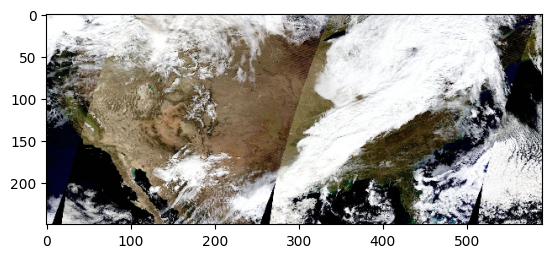

In [5]:
# Crop and plot the global extents TIFF file using the US box Shapefile 
with fiona.open("us_box.shp", "r") as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

with rasterio.open("global_extents.tiff") as src:
    out_image, out_transform = rasterio.mask.mask(src, shapes, crop=True)
    out_meta = src.meta

plt.imshow(out_image.transpose(1, 2, 0))  # Transpose to (height, width, channels) for plotting
plt.show()

### Integrating an External Service

There may be instances in which an external service would be useful to use in tandem with the GIBS API. One example is the <a href="https://eonet.gsfc.nasa.gov">EONET Natural Event Tracker API</a>, which can provide information on natural events such as fires, floods, storms, and more.

Below, we will obtain a list of events available from the API for a specified date range.

In [40]:
# Get a list of events for the chosen date with the EONET API
baseUrl = "http://eonet.gsfc.nasa.gov/api/v3/events"
startdate = "2021-12-15"
enddate = "2022-01-25"
categories = ['volcanoes','wildfires']
try:
    r = requests.get(baseUrl, params={"start": startdate, "end": enddate})
except requests.exceptions.HTTPError as e:
    msg = "{}. \n{} \nResponse: {}".format(e.message,
                                            e.request,
                                            e.response)
    print(msg)

# Used to determine whether an event fits the categories denoted in the list of desired categories
def is_category(event):
    for category in categories:
        for event_cat in event['categories']:
            if category in event_cat.values():
                return True
    return False

events = None
response = r.json()
if isinstance(response, dict):
    events = list(filter(is_category, response['events']))
    print("Number of events obtained: {}".format(len(events)))

Number of events obtained: 4


By following the process used in the <a href="#visualize_wms_global_raster_data">"Visualize WMS Global Raster Data"</a> example, events for an arbitrary timespan can be displayed as points overlayed on GIBS imagery.

Note that this can also be performed using WMTS rather than WMS by following the process in the <a href="#visualize_wmts_raster_data">"Visualize WMTS Raster Data by GDAL"</a> example.

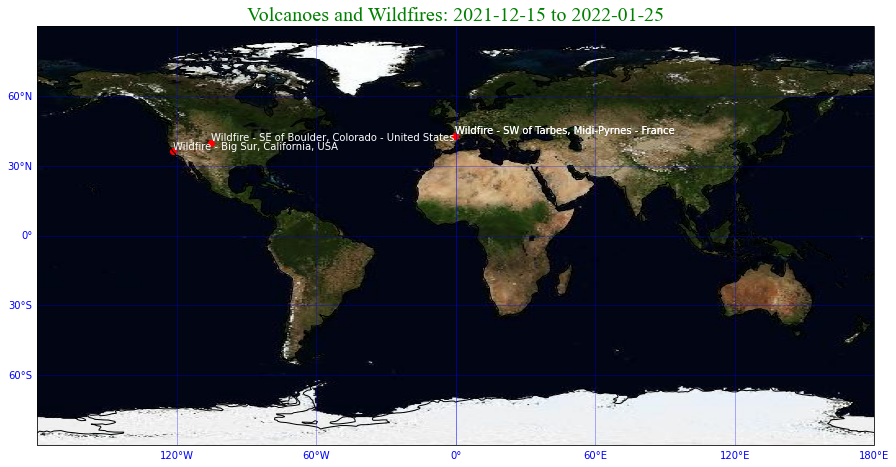

In [41]:
# Construct global image URL.
proj4326 = 'https://gibs.earthdata.nasa.gov/wms/epsg4326/best/wms.cgi?\
version=1.3.0&service=WMS&request=GetMap&\
format=image/jpeg&STYLE=default&bbox=-90,-180,90,180&CRS=EPSG:4326&\
HEIGHT=512&WIDTH=512&layers=BlueMarble_NextGeneration'

# Request image.
img = io.imread(proj4326)

# Display image on map.
plt.figure(figsize = (15, 10))
ax = plt.axes(projection = ccrs.PlateCarree(central_longitude = 0))
cmp = plt.imshow(img, transform = ccrs.PlateCarree(), extent = (-180,180,-90,90), origin = 'upper')

# Draw coastline.
ax.coastlines()

# Plot the events on the graph.
# First obtain event coordinates and titles.
longitudes = []
latitudes = []
titles = []
for event in events:
    for geometry in event['geometry']:
        longitudes.append(geometry['coordinates'][0])
        latitudes.append(geometry['coordinates'][1])
        titles.append(event['title'])

# Plot the events
ax.scatter(longitudes, latitudes, color = 'red')

# Annotate the event points
for i, title in enumerate(titles):
    plt.annotate(title, (longitudes[i], latitudes[i]+ 1), color = 'white')

# Draw grid.
gl = ax.gridlines(ccrs.PlateCarree(), linewidth = 1, color = 'blue', alpha = 0.3,  draw_labels = True)
gl.top_labels = False
gl.right_labels = False
gl.xlines = True
gl.ylines = True
gl.xlocator = mticker.FixedLocator([0, 60, 120, 180, -120, -60, 0])
gl.ylocator = mticker.FixedLocator([-90, -60, -30, 0, 30, 60, 90])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlabel_style = {'color': 'blue'}
gl.ylabel_style = {'color': 'blue'}

plt.title('Volcanoes and Wildfires: {} to {}'.format(startdate, enddate),fontname="Times New Roman", fontsize = 20, color = 'green')

plt.show();

### Bulk Downloading of GIBS Imagery

It can sometimes be useful to download large amounts of imagery at once, such as for use as training and test data for machine learning.

For this example, we will perform a bulk download of the MODIS Terra Surface Reflectance (Bands 1-4-3) layer, with each image representing a different date in a date range. Each image will cover a 45° longitude by 45° latitude subsection of the planet.

_Note that 45° longitude by 45° latitude subsections will cause the actual Earth coverage size of each image to be inconsistent because the distance between lines of longitude shrinks as latitude approaches the poles._

In [42]:
import datetime

startdate = datetime.date(2021,12,25)
enddate = datetime.date(2022,1,1)
img_extent_step = 45

outdir = os.path.join(os.getcwd(), "python-examples", "SurfaceReflectance_{}_to_{}".format(startdate,enddate))
currentdate = startdate

# Create directory if it doesn't exist yet
if not os.path.exists(outdir):
    os.mkdir(outdir)

while currentdate < enddate:
    print("Downloading images for {}...".format(currentdate))
    for longitude in range(-90,90,img_extent_step):
        for latitude in range(-180,180,img_extent_step):
            extents = "{0},{1},{2},{3}".format(latitude, longitude,
                                               latitude + img_extent_step,
                                               longitude + img_extent_step)

            # Construct image URL.
            # The available options for the format parameter are: image/png, image/tiff, image/jpeg
            url = 'https://gibs.earthdata.nasa.gov/wms/epsg4326/best/wms.cgi?\
version=1.3.0&service=WMS&request=GetMap&\
format=image/png&STYLE=default&bbox={0}&CRS=EPSG:4326&\
HEIGHT=512&WIDTH=512&TIME={1}&layers=MODIS_Terra_SurfaceReflectance_Bands143'.format(extents, currentdate)

            # Request and save image
            img = plimg.fromarray(io.imread(url))
            img.save(os.path.join(outdir,'img_{0}_{1}.png'.format(currentdate, extents)))
    
    currentdate += datetime.timedelta(1)

print("Number of images downloaded:", len(os.listdir(outdir)))

Number of images downloaded: 224


### Ideas for Machine Learning with GIBS Imagery

Possible machine learning tasks:

- Identifying surface features (lakes, bays, fields, forests, urban sprawl, etc)
    - Procedure:
        1. Obtain satellite imagery from a chosen data product.
        2. Label the imagery by creating a list with each entry corresponding a particular image's surface feature.
        3. Build a convolutional neural network using a package such as [Tensorflow](https://www.tensorflow.org/) using the labeled imagery as training and validation data.
        4. Create a plot visualizing the change in accuracy of the identifier as it was trained.
- Identifying low-altitude clouds using true-color images
    - Relevant layers:
        - To be classified:
            - True-color layers
        - For validation/labeling:
            - Cloud Top Height
            - Cloud Top Pressure
    - Procedure:
        1. Obtain imagery for the true-color layers and corresponding maps for Cloud Top Height and/or Cloud Top Pressure.
        2. Perform an analysis of the Cloud Top Height/Pressure imagery to create labels for the corresponding true-color images, labeling each as either containing or not containing low-altitude clouds.
        3. Build a convolutional neural network using a package such as Tensorflow using the labeled imagery as training and validation data.
        4. Create a plot visualizing the change in accuracy of the identifier as it was trained.
- Identifying areas with high fire concentrations
    - Procedure:
        1. Obtain tiles for a Thermal Anomalies and Fires vector layer over a selected time dimension.
        2. Vectorize the data using each point's coordinates and time.
        3. Perform a cluster analysis of the vectorized data using K-means or another clustering algorithm.
        4. Examine contents of each generated cluster to see if there is useful knowledge to be gained from it.

Other groups that have engaged in similar projects for machine learning include NASA IMPACT and SpaceML:
 - NASA IMPACT's [Phenomena Detection Portal](http://phenomena.surge.sh/) uses a trained model for detecting atmospheric phenomena. To train the model, MODIS imagery was obtained using NASA IMPACT's [ImageLabeler](https://impact.earthdata.nasa.gov/labeler/) tool, which in turn uses the GIBS API.
 - [SpaceML](http://spaceml.org/) has created several Earth science machine learning projects, including [NASA GIBS Worldview Similarity Search](https://spaceml.org/repo/project/605b7b751644770011e850c3), which uses the GIBS API.